# 0. Prepare data

## A.scRNA-seq

In [58]:
# Load genes in original analysis
from loomxpy.loomxpy import SCopeLoom
from pycisTopic.loom import *
import itertools
import anndata
# Format and create layered anndata
import pandas as pd
vm_rna = pd.read_csv('/staging/leuven/stg_00002/lcb/cbravo/EAD_v2/data/ScoMAP/VM_RNA_MAPPED.tsv', sep='\t')
vm_rna.columns = 'VM_RNA_'+ vm_rna.columns
vm_rna['VM_cell_name'] = vm_rna.index
path_to_loom = '/staging/leuven/stg_00002/lcb/cbravo/EAD_v2/data/EAD_scRNAseq_SCENICandSeurat.loom'
loom = SCopeLoom.read_loom(path_to_loom)
metadata = get_metadata(loom)
metadata['RNA_cell_barcode'] = metadata.index
vm_rna = vm_rna.merge(metadata, left_on='VM_RNA_RM_assignment', right_on='RNA_cell_barcode', how='inner')
expr_mat = loom.ex_mtx
genes = expr_mat.columns.tolist()
expr_mat.shape

(3531, 8744)

In [59]:
# Spliced
import pandas as pd
r1 = pd.read_csv('/staging/leuven/stg_00002/lcb/cbravo/Bravo_et_al_EyeAntennalDisc_GEO_submission/10X_scRNAseq/MAPPED/10X_SCRNASEQ_WT_EA_S1_exon.txt', sep='\t', skiprows=1)
r2 = pd.read_csv('/staging/leuven/stg_00002/lcb/cbravo/Bravo_et_al_EyeAntennalDisc_GEO_submission/10X_scRNAseq/MAPPED/10X_SCRNASEQ_WT_EA_S2_exon.txt', sep='\t', skiprows=1)
r3 = pd.read_csv('/staging/leuven/stg_00002/lcb/cbravo/Bravo_et_al_EyeAntennalDisc_GEO_submission/10X_scRNAseq/MAPPED/10X_SCRNASEQ_WT_EA_S3_exon.txt', sep='\t', skiprows=1)
r1.index = r1['Geneid']
r2.index = r2['Geneid']
r3.index = r3['Geneid']
r1=r1.iloc[:,6:]
r2=r2.iloc[:,6:]
r3=r3.iloc[:,6:]
r1.columns=[x.split(':')[1].split('-')[0]+'.1' for x in r1.columns]
r2.columns=[x.split(':')[1].split('-')[0]+'.2' for x in r2.columns]
r3.columns=[x.split(':')[1].split('-')[0]+'.3' for x in r3.columns]
expr_mat_spliced = pd.concat([r1.T, r2.T, r3.T], join='inner')
# Unspliced
r1 = pd.read_csv('/staging/leuven/stg_00002/lcb/cbravo/Bravo_et_al_EyeAntennalDisc_GEO_submission/10X_scRNAseq/MAPPED/10X_SCRNASEQ_WT_EA_S1_gene.txt', sep='\t', skiprows=1)
r2 = pd.read_csv('/staging/leuven/stg_00002/lcb/cbravo/Bravo_et_al_EyeAntennalDisc_GEO_submission/10X_scRNAseq/MAPPED/10X_SCRNASEQ_WT_EA_S2_gene.txt', sep='\t', skiprows=1)
r3 = pd.read_csv('/staging/leuven/stg_00002/lcb/cbravo/Bravo_et_al_EyeAntennalDisc_GEO_submission/10X_scRNAseq/MAPPED/10X_SCRNASEQ_WT_EA_S3_gene.txt', sep='\t', skiprows=1)
r1.index = r1['Geneid']
r2.index = r2['Geneid']
r3.index = r3['Geneid']
r1=r1.iloc[:,6:]
r2=r2.iloc[:,6:]
r3=r3.iloc[:,6:]
r1.columns=[x.split(':')[1].split('-')[0]+'.1' for x in r1.columns]
r2.columns=[x.split(':')[1].split('-')[0]+'.2' for x in r2.columns]
r3.columns=[x.split(':')[1].split('-')[0]+'.3' for x in r3.columns]
expr_mat_unspliced = pd.concat([r1.T, r2.T, r3.T], join='inner')
# Format and create layered anndata
import pandas as pd
vm_rna = pd.read_csv('/staging/leuven/stg_00002/lcb/cbravo/EAD_v2/data/ScoMAP/VM_RNA_MAPPED.tsv', sep='\t')
vm_rna.columns = 'VM_RNA_'+ vm_rna.columns
vm_rna['VM_cell_name'] = vm_rna.index
## RNA - Create Anndata
from loomxpy.loomxpy import SCopeLoom
from pycisTopic.loom import *
import itertools
import anndata
path_to_loom = '/staging/leuven/stg_00002/lcb/cbravo/EAD_v2/data/EAD_scRNAseq_SCENICandSeurat.loom'
loom = SCopeLoom.read_loom(path_to_loom)
metadata = get_metadata(loom)
metadata['RNA_cell_barcode'] = metadata.index
expr_mat_spliced = expr_mat_spliced.loc[metadata.index, genes]
expr_mat_unspliced = expr_mat_unspliced.loc[metadata.index, genes]
vm_rna = vm_rna.merge(metadata, left_on='VM_RNA_RM_assignment', right_on='RNA_cell_barcode', how='inner')
expr_mat_spliced['RNA_cell_barcode'] =  expr_mat_spliced.index
expr_mat_spliced = expr_mat_spliced.merge(vm_rna, left_on='RNA_cell_barcode', right_on='VM_RNA_RM_assignment', how='inner')
expr_mat_spliced.index = expr_mat_spliced['VM_cell_name']
expr_mat_spliced.index.name = None
expr_mat_spliced = expr_mat_spliced.loc[sorted(vm_rna['VM_cell_name']),]
expr_mat_spliced = expr_mat_spliced.iloc[:,1:8743]
expr_mat_unspliced['RNA_cell_barcode'] = expr_mat_unspliced.index
expr_mat_unspliced = expr_mat_unspliced.merge(vm_rna, left_on='RNA_cell_barcode', right_on='VM_RNA_RM_assignment', how='inner')
expr_mat_unspliced.index = expr_mat_unspliced['VM_cell_name']
expr_mat_unspliced.index.name = None
expr_mat_unspliced = expr_mat_unspliced.loc[sorted(vm_rna['VM_cell_name']),]
expr_mat_unspliced = expr_mat_unspliced.iloc[:,1:8743]
vm_rna.index = vm_rna['VM_cell_name']
vm_rna = vm_rna.loc[sorted(vm_rna['VM_cell_name']),]
rna_anndata = anndata.AnnData(X= expr_mat_spliced, layers={'spliced': expr_mat_spliced, 'unspliced': expr_mat_unspliced})
rna_anndata.obs = vm_rna

In [95]:
rna_anndata.write_h5ad('/staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/EAD_3/velocity/rna_anndata.h5ad')

## B. scATAC-seq

In [21]:
# Metadata
import pickle
infile = open('/staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/EAD_3/atac/pycisTopic/All_EAD_cisTopicObject_wmodel_500bp.pkl', 'rb')
cistopic_obj = pickle.load(infile)
infile.close()

In [22]:
## Format ATAC
import pandas as pd
vm_atac = pd.read_csv('/staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/EAD_3/data/data/ScoMAP/VM_ATAC_MAPPED_SCENIC+.tsv', sep='\t')
vm_atac.columns = 'VM_ATAC_'+ vm_atac.columns
vm_atac['VM_cell_name'] = vm_atac.index
# Cell metadata
metadata = cistopic_obj.cell_data.copy()
metadata.index = [x.replace('-1___Run_', '.') for x in metadata.index]
metadata['ATAC_cell_barcode'] = metadata.index
vm_atac = vm_atac.merge(metadata, left_on='VM_ATAC_RM_assignment', right_on='ATAC_cell_barcode', how='inner')
vm_atac.columns = 'ACC_'+vm_atac.columns
vm_rna.columns = 'EXP_'+vm_rna.columns
metadata_cell = vm_rna.merge(vm_atac, left_on='EXP_VM_cell_name', right_on='ACC_VM_cell_name', how='inner')
metadata_cell.index=metadata_cell['EXP_VM_cell_name']
metadata_cell.index.name = None
metadata_cell = metadata_cell.loc[sorted(metadata_cell['EXP_VM_cell_name']),]
metadata_region = cistopic_obj.region_data
dr_cell = {'Virtual_map':pd.DataFrame([metadata_cell.EXP_VM_RNA_x, metadata_cell.EXP_VM_RNA_y], index=['VM_1', 'VM_2'], columns = metadata_cell.index).T.loc[sorted(metadata_cell['EXP_VM_cell_name']),]}

In [23]:
x = cistopic_obj.fragment_matrix.todense()

In [30]:
imputed_acc_obj_pd = pd.DataFrame(x.T, index = cistopic_obj.cell_names, columns = cistopic_obj.region_names)
imputed_acc_obj_pd.index = [x.replace('-1___Run_', '.') for x in imputed_acc_obj_pd.index]
imputed_acc_obj_pd['ATAC_cell_barcode'] =  imputed_acc_obj_pd.index
imputed_acc_obj_pd = imputed_acc_obj_pd.merge(vm_atac, left_on='ATAC_cell_barcode', right_on='ACC_ATAC_cell_barcode', how='inner')
imputed_acc_obj_pd.index = imputed_acc_obj_pd['ACC_VM_cell_name']

In [31]:
imputed_acc_obj_pd

,2R:14128580-14129080,3R:30025964-30026464,2R:19994888-19995388,2R:3171581-3173487,3L:18438407-18439504,X:5607615-5608129,3L:1411472-1411524,2R:15945434-15945503,3R:9647140-9648122,2L:2576508-2577008,3R:30003009-30003073,3L:3811671-3811946,2R:4748217-4749272,3R:4290545-4291105,3R:5391998-5392498,2R:14556250-14556990,3L:19056627-19057127,3R:13354924-13354983,3L:7931248-7931755,3L:17423040-17423098,3R:14326161-14326661,2L:2097588-2098217,2R:21616535-21617035,3R:19321817-19322317,2L:7558171-7558671,X:10778127-10778211,3R:27573846-27574992,X:20775561-20776094,3R:9985414-9985478,X:11791183-11791358,2R:22023170-22024256,2L:5908934-5909051,2R:22697335-22697402,X:13682819-13683319,2L:6687059-6687559,4:1116597-1116660,3R:18430963-18431450,2L:10957649-10958614,2L:21618516-21619016,2R:14462105-14462183,2R:7950331-7950503,X:9820117-9821104,2L:9766104-9766159,3L:4279116-4279185,2L:22536462-22536962,3L:6085348-6085848,3R:18972918-18972982,3R:31975212-31976145,X:258079-258142,X:16641284-16641784,...,Y:372542-374631,Y:463458-466252,Y:477459-477513,Y:490487-490552,Y:662012-662067,Y:74311-76458,Y:782964-787144,Y:81910-82648,ATAC_cell_barcode,ACC_VM_ATAC_x,ACC_VM_ATAC_y,ACC_VM_ATAC_R,ACC_VM_ATAC_G,ACC_VM_ATAC_B,ACC_VM_ATAC_cluster,ACC_VM_ATAC_cluster_color,ACC_VM_ATAC_cluster_refined,ACC_VM_ATAC_cluster_refined_color,ACC_VM_ATAC_cluster_annot,ACC_VM_ATAC_is.landmark,ACC_VM_ATAC_RM_assignment,ACC_VM_ATAC_RM_cell_type,ACC_VM_ATAC_RM_landmark,ACC_VM_ATAC_RM_pseudotime,ACC_VM_ATAC_RM_posLandmark,ACC_VM_ATAC_RM_spatial_cluster,ACC_VM_ATAC_DistanceFromLandmark,ACC_VM_ATAC_PseudotimeRank,ACC_VM_cell_name,ACC_cisTopic_nr_frag,ACC_cisTopic_log_nr_frag,ACC_cisTopic_nr_acc,ACC_cisTopic_log_nr_acc,ACC_sample_id,ACC_Log_total_nr_frag,ACC_Log_unique_nr_frag,ACC_Total_nr_frag,ACC_Unique_nr_frag,ACC_Dupl_nr_frag,ACC_Dupl_rate,ACC_Total_nr_frag_in_regions,ACC_Unique_nr_frag_in_regions,ACC_FRIP,ACC_TSS_enrichment,ACC_barcode,ACC_cell_type,ACC_Doublet_scores_fragments,ACC_Predicted_doublets_fragments,ACC_pycisTopic_leiden_10_0.9,ACC_ATAC_cell_barcode
ACC_VM_cell_name,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
34_41,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,TCGCCTATCGGTCAGC.1,34,41,0.890196,0.047059,0.074510,5,#FFC05A,5,#FFC05A,Antenna_A3_Arista,NaN,TCGCCTATCGGTCAGC.1,Antenna_A3_Arista,Antenna,3979,Before,Antenna_A3_Arista,5.656854,360,34_41,6046,3.781468,4883,3.688687,Run_1,4.335197,3.832892,21637,6806,14831,0.685446,18917,5871,0.862621,6.069032,TCGCCTATCGGTCAGC-1,Antenna_A3_Arista,0.237569,False,Antenna_A3_Arista,TCGCCTATCGGTCAGC.1
81_52,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,GACCGACTCTTAATCC.1,81,52,0.890196,0.047059,0.078431,8,#FFACAC,8,#FFACAC,PMF_PR_Early,NaN,GACCGACTCTTAATCC.1,PMF_PR_Early,Eye,6319,After,PMF_PR_Early,8.000000,127,81_52,6533,3.815113,5276,3.722305,Run_1,4.563434,3.866228,36596,7349,29247,0.799186,32184,6399,0.870731,5.840409,GACCGACTCTTAATCC-1,PMF_PR_Early,0.220104,False,PMF_PR_Early,GACCGACTCTTAATCC.1
54_61,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,2,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,...,0,0,0,0,0,0,0,0,TGGAAGGAGTCGATAA.1,54,61,0.890196,0.047059,0.078431,4,#FDA7F9,4,#FDA7F9,AMF_prog_prec,NaN,TGGAAGGAGTCGATAA.1,AMF_Prec,Eye,375,Before,AMF_prog_prec,18.248288,1931,54_61,8540,3.931458,6389,3.805433,Run_1,4.373960,3.985875,23657,9680,13977,0.590819,20685,8383,0.866012,6.282206,TGGAAGGAGTCGATAA-1,AMF_prog,0.18429,False,AMF_prog,TGGAAGGAGTCGATAA.1
19_36,0,0,0,0,0,0,0,0,0,2,0,0,0,0,3,0,0,0,0,1,3,0,0,5,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,...,0,0,0,0,0,0,0,0,CTGAATGCAATGGTAA.1,19,36,0.890196,0.047059,0.074510,2,#C0CAFF,2,#C0CAFF,Antenna_A2,NaN,CTGAATGCAATGGTAA.1,Antenna_A2b,Antenna,2307,Before,Antenna_A2,14.212670,775,19_36,24055,4.381205,14560,4.163161,Run_1,4.829124,4.448845,67472,28109,39363,0.583

In [32]:
imputed_acc_obj_pd.columns[125182:]

Index(['ATAC_cell_barcode', 'ACC_VM_ATAC_x', 'ACC_VM_ATAC_y', 'ACC_VM_ATAC_R',
       'ACC_VM_ATAC_G', 'ACC_VM_ATAC_B', 'ACC_VM_ATAC_cluster',
       'ACC_VM_ATAC_cluster_color', 'ACC_VM_ATAC_cluster_refined',
       'ACC_VM_ATAC_cluster_refined_color', 'ACC_VM_ATAC_cluster_annot',
       'ACC_VM_ATAC_is.landmark', 'ACC_VM_ATAC_RM_assignment',
       'ACC_VM_ATAC_RM_cell_type', 'ACC_VM_ATAC_RM_landmark',
       'ACC_VM_ATAC_RM_pseudotime', 'ACC_VM_ATAC_RM_posLandmark',
       'ACC_VM_ATAC_RM_spatial_cluster', 'ACC_VM_ATAC_DistanceFromLandmark',
       'ACC_VM_ATAC_PseudotimeRank', 'ACC_VM_cell_name',
       'ACC_cisTopic_nr_frag', 'ACC_cisTopic_log_nr_frag',
       'ACC_cisTopic_nr_acc', 'ACC_cisTopic_log_nr_acc', 'ACC_sample_id',
       'ACC_Log_total_nr_frag', 'ACC_Log_unique_nr_frag', 'ACC_Total_nr_frag',
       'ACC_Unique_nr_frag', 'ACC_Dupl_nr_frag', 'ACC_Dupl_rate',
       'ACC_Total_nr_frag_in_regions', 'ACC_Unique_nr_frag_in_regions',
       'ACC_FRIP', 'ACC_TSS_enrichment', '

In [33]:
imputed_acc_obj_pd = imputed_acc_obj_pd.iloc[:,0:125182]
imputed_acc_obj_pd.index.name = None
imputed_acc_obj_pd = imputed_acc_obj_pd.loc[sorted(vm_atac['ACC_VM_cell_name']),]
metadata_region = metadata_region.loc[imputed_acc_obj_pd.columns]

In [34]:
atac_anndata = anndata.AnnData(X=imputed_acc_obj_pd)

In [35]:
atac_anndata

AnnData object with n_obs × n_vars = 5296 × 125182

In [36]:
atac_anndata.write_h5ad('/staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/EAD_3/velocity/atac_anndata.h5ad')

## C. scATAC-seq imputed

In [56]:
# Metadata
import pickle
infile = open('/staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/EAD_3/atac/pycisTopic/All_EAD_cisTopicObject_wmodel_500bp.pkl', 'rb')
cistopic_obj = pickle.load(infile)
infile.close()

/user/leuven/313/vsc31305/.local/lib/python3.7/site-packages/scipy/sparse/sparsetools.py:21: DeprecationWarning: `scipy.sparse.sparsetools` is deprecated!
scipy.sparse.sparsetools is a private module for scipy.sparse, and should not be used.
  _deprecated()


In [60]:
## Format ATAC
import pandas as pd
vm_atac = pd.read_csv('/staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/EAD_3/data/data/ScoMAP/VM_ATAC_MAPPED_SCENIC+.tsv', sep='\t')
vm_atac.columns = 'VM_ATAC_'+ vm_atac.columns
vm_atac['VM_cell_name'] = vm_atac.index
# Cell metadata
metadata = cistopic_obj.cell_data.copy()
metadata.index = [x.replace('-1___Run_', '.') for x in metadata.index]
metadata['ATAC_cell_barcode'] = metadata.index
vm_atac = vm_atac.merge(metadata, left_on='VM_ATAC_RM_assignment', right_on='ATAC_cell_barcode', how='inner')
vm_atac.columns = 'ACC_'+vm_atac.columns
vm_rna.columns = 'EXP_'+vm_rna.columns
metadata_cell = vm_rna.merge(vm_atac, left_on='EXP_VM_cell_name', right_on='ACC_VM_cell_name', how='inner')
metadata_cell.index=metadata_cell['EXP_VM_cell_name']
metadata_cell.index.name = None
metadata_cell = metadata_cell.loc[sorted(metadata_cell['EXP_VM_cell_name']),]
metadata_region = cistopic_obj.region_data
dr_cell = {'Virtual_map':pd.DataFrame([metadata_cell.EXP_VM_RNA_x, metadata_cell.EXP_VM_RNA_y], index=['VM_1', 'VM_2'], columns = metadata_cell.index).T.loc[sorted(metadata_cell['EXP_VM_cell_name']),]}

In [61]:
import pickle
infile = open('/staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/EAD_3/atac/pycisTopic/DARs/Imputed_accessibility_500bp.pkl', 'rb') #Here I am using pycisTopic gene activity matrix, but could be any :)
imputed_acc_obj = pickle.load(infile)
infile.close()
import pandas as pd
imputed_acc_obj_pd = pd.DataFrame(imputed_acc_obj.mtx, columns = imputed_acc_obj.cell_names, index = imputed_acc_obj.feature_names).T
imputed_acc_obj_pd.index = [x.replace('-1___Run_', '.') for x in imputed_acc_obj_pd.index]
imputed_acc_obj_pd['ATAC_cell_barcode'] =  imputed_acc_obj_pd.index
imputed_acc_obj_pd = imputed_acc_obj_pd.merge(vm_atac, left_on='ATAC_cell_barcode', right_on='ACC_ATAC_cell_barcode', how='inner')
imputed_acc_obj_pd.index = imputed_acc_obj_pd['ACC_VM_cell_name']
imputed_acc_obj_pd = imputed_acc_obj_pd.iloc[:,0:124894]
imputed_acc_obj_pd.index.name = None
imputed_acc_obj_pd = imputed_acc_obj_pd.loc[sorted(vm_atac['ACC_VM_cell_name']),]
metadata_region = metadata_region.loc[imputed_acc_obj_pd.columns]

In [62]:
atac_anndata = anndata.AnnData(X=imputed_acc_obj_pd)

In [63]:
atac_anndata

AnnData object with n_obs × n_vars = 5296 × 124894

In [64]:
atac_anndata.write_h5ad('/staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/EAD_3/velocity/atac_anndata_imputed.h5ad')

# 1. Try velocity in RNA alone

In [1]:
# To read
import scanpy as sc
adata = sc.read_h5ad('/staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/EAD_3/velocity/rna_anndata.h5ad')

/user/leuven/313/vsc31305/.local/lib/python3.7/site-packages/dask/config.py:161: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  data = yaml.load(f.read()) or {}


In [25]:
# Add UMAP from the other object
import scanpy as sc
adata_force = sc.read_h5ad('/staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/EAD_3/atac/scenicplus_v2/differenrentiation_tutorial_4.h5ad')

In [3]:
adata = adata[adata_force.obs.index.tolist()]
adata.obsm['X_umap'] = adata_force.obsm['X_umap']
adata.obs = adata_force.obs

In [1]:
import scvelo as scv
scv.set_figure_params()
scv.__version__

/user/leuven/313/vsc31305/.local/lib/python3.7/site-packages/dask/config.py:161: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  data = yaml.load(f.read()) or {}


'0.2.5'

In [5]:
scv.pp.filter_and_normalize(adata)
scv.pp.moments(adata)

Normalized count data: X, spliced, unspliced.
Logarithmized X.
computing neighbors
    finished (0:00:26) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:04) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [6]:
scv.tl.velocity(adata, mode='stochastic')

computing velocities
    finished (0:00:15) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)


In [7]:
scv.tl.velocity_graph(adata)

computing velocity graph (using 1/36 cores)


  0%|          | 0/3104 [00:00<?, ?cells/s]

    finished (0:01:10) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


In [8]:
colors={
    "AMF_Prog": "#FCC39E",
    "AMF_Prec": "#42B86E",
    "MF_Morphogenetic_Furrow": "#A8D05A",
    "PMF_Interommatidial": "#B5DEFF",
    "PMF_Interommatidial_Late": "#82D3EA",
    "PMF_PR_Early": "#42C6EC",
    "PMF_PR_Intermediate": "#63BBD1",
    "PMF_PR_Late": "#12b0de",
    "SMW": "#4C9A2A"
}

/data/leuven/software/biomed/skylake_centos7/2018a/software/BiomedBundle/20190901-foss-2018a-Python-3.7.4/lib/python3.7/site-packages/sklearn/neighbors/base.py:441: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  old_joblib = LooseVersion(joblib_version) < LooseVersion('0.12')


saving figure to file /staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/EAD_3/velocity/scvelo_strean.png


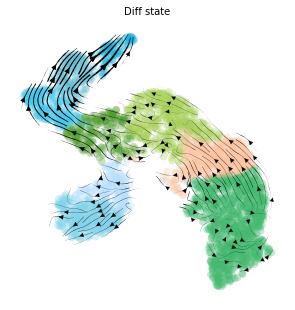

In [12]:
%matplotlib inline
from matplotlib.pyplot import rc_context
with rc_context({'figure.figsize': (5,5)}):
    scv.pl.velocity_embedding_stream(adata, basis='umap', color='Diff_state', palette=[colors[x] for x in colors.keys()], legend_loc='none', save='/staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/EAD_3/velocity/scvelo_strean.png')

saving figure to file /staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/EAD_3/velocity/scvelo_comparison.png


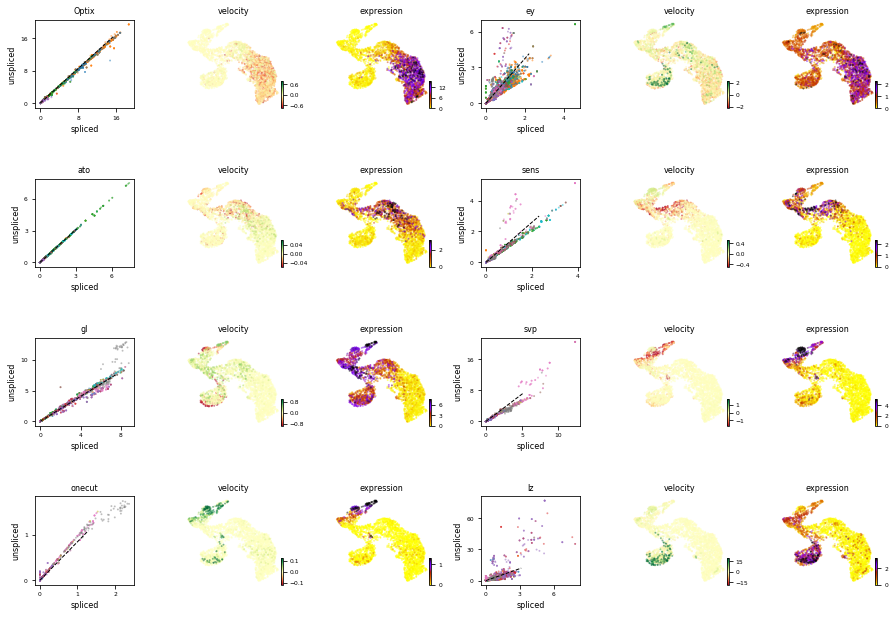

In [17]:
%matplotlib inline
from matplotlib.pyplot import rc_context
with rc_context({'figure.figsize': (5,5)}):
    scv.pl.velocity(adata, ['Optix', 'ey', 'ato', 'sens', 'gl', 'svp', 'onecut', 'lz'], ncols=2, figsize=(5,5), save='/staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/EAD_3/velocity/scvelo_comparison.png')

In [20]:
scv.tl.velocity_pseudotime(adata)

computing terminal states
    identified 10 regions of root cells and 1 region of end points .
    finished (0:00:13) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)


In [32]:
# Save
adata.write_h5ad('/staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/EAD_3/velocity/rna_anndata_with_velocity_pseudotime.h5ad')

In [42]:
# To read
import scanpy as sc
adata = sc.read_h5ad('/staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/EAD_3/velocity/rna_anndata_with_velocity_pseudotime.h5ad')

/opt/venv/lib/python3.8/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


/opt/venv/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


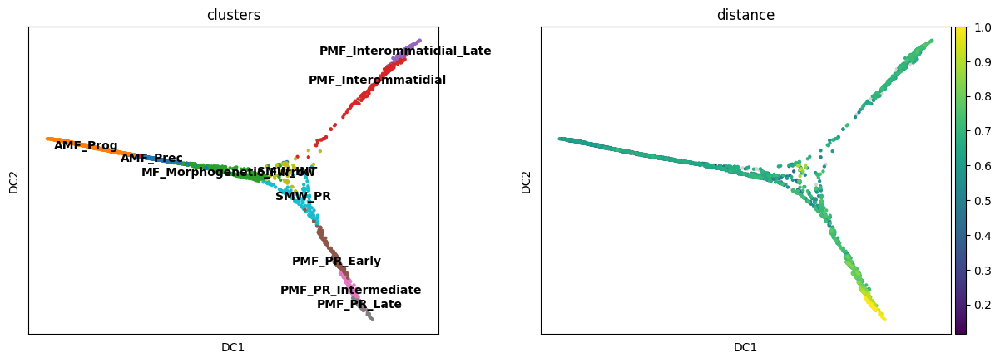

/opt/venv/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


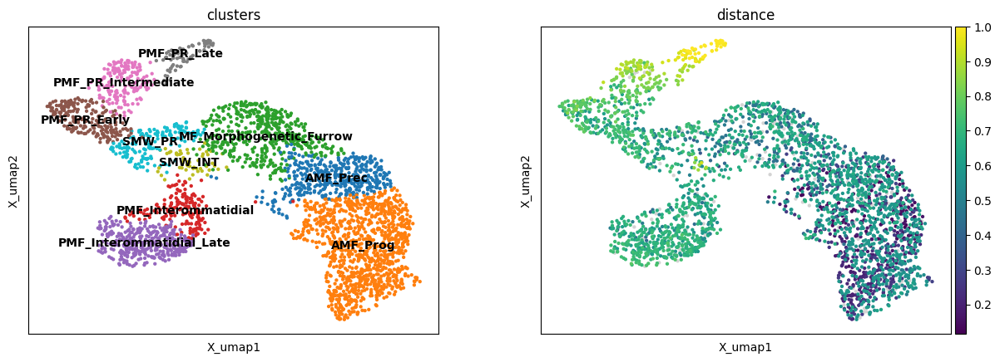

In [43]:
# Choose the embedding you want to plot arrows in. Here I will use the refined annotation because it separates better the branches in the diffusion map.
# The function will already save the annotations as clusters and distance, which are require for downstream steps.
from scenicplus.differentiation_potential import *
def get_embedding_dpt(adata, group_var, root_group, embedding_key='X_umap', n_dcs=2, figsize=(12,8), save_dpt=None, save_pl=None, palette=None):
    adata_h = anndata.AnnData(X=pd.DataFrame(adata.obsm[embedding_key], index=adata.obs.index))
    adata_h.obs = adata.obs.copy()
    sc.pp.neighbors(adata_h)
    adata_h.obs['clusters'] = adata_h.obs[group_var] 
    sc.tl.diffmap(adata_h, random_state=5)
    adata_h.uns['iroot'] = np.flatnonzero(adata_h.obs[group_var]  == root_group)[0]
    sc.tl.dpt(adata_h, n_dcs=n_dcs)
    adata_h.obs['distance'] = adata_h.obs['velocity_pseudotime']
    sc.pl.diffmap(adata_h, color=['clusters', 'distance'], legend_loc='on data', projection='2d', save=save_dpt, palette=palette)
    adata.obs['dpt_pseudotime'] = adata_h.obs['dpt_pseudotime'].copy()
    adata.obs['distance'] = adata.obs['velocity_pseudotime']
    adata.obs['clusters'] = adata.obs[group_var] 
    sc.pl.embedding(adata, embedding_key, color=['clusters', 'distance'], legend_loc='on data', cmap='viridis', save=save_pl, palette=palette)
import os
os.chdir('/staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/EAD_3/velocity/')
get_embedding_dpt(adata, 'Diff_state_refined', 'AMF_Prog', embedding_key='X_umap', n_dcs=2, figsize=(12,8), save_dpt='diffmap.pdf', save_pl='umap.pdf')

In [61]:
# Add UMAP from the other object
import scanpy as sc
adata_force = sc.read_h5ad('/staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/EAD_3/atac/scenicplus_v2/differenrentiation_tutorial_3.h5ad')
adata_force.obs = adata.obs

In [62]:
adata_force

AnnData object with n_obs × n_vars = 3104 × 9456
    obs: 'EXP_VM_RNA_x', 'EXP_VM_RNA_y', 'EXP_VM_RNA_R', 'EXP_VM_RNA_G', 'EXP_VM_RNA_B', 'EXP_VM_RNA_cluster', 'EXP_VM_RNA_cluster_color', 'EXP_VM_RNA_cluster_refined', 'EXP_VM_RNA_cluster_refined_color', 'EXP_VM_RNA_cluster_annot', 'EXP_VM_RNA_is.landmark', 'EXP_VM_RNA_RM_assignment', 'EXP_VM_RNA_RM_cell_type', 'EXP_VM_RNA_RM_landmark', 'EXP_VM_RNA_RM_pseudotime', 'EXP_VM_RNA_RM_posLandmark', 'EXP_VM_RNA_RM_spatial_cluster', 'EXP_VM_RNA_DistanceFromLandmark', 'EXP_VM_RNA_PseudotimeRank', 'EXP_VM_cell_name', 'EXP_Seurat_res_1.2', 'EXP_Experiment Run', 'EXP_Ariss labels', 'EXP_ATAC labels', 'EXP_RNA_cell_barcode', 'ACC_VM_ATAC_x', 'ACC_VM_ATAC_y', 'ACC_VM_ATAC_R', 'ACC_VM_ATAC_G', 'ACC_VM_ATAC_B', 'ACC_VM_ATAC_cluster', 'ACC_VM_ATAC_cluster_color', 'ACC_VM_ATAC_cluster_refined', 'ACC_VM_ATAC_cluster_refined_color', 'ACC_VM_ATAC_cluster_annot', 'ACC_VM_ATAC_is.landmark', 'ACC_VM_ATAC_RM_assignment', 'ACC_VM_ATAC_RM_cell_type', 'ACC_VM_ATAC

In [67]:
cells=adata_force.obs['velocity_pseudotime'].dropna().index.tolist()

In [68]:
adata_force = adata_force[cells]

In [69]:
# Save
adata_force.write_h5ad('/staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/EAD_3/velocity/rna_anndata_with_velocity_pseudotime.h5ad')

### B. Inferring differentiation arrows

In [70]:
# To read
import scanpy as sc
adata = sc.read_h5ad('/staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/EAD_3/velocity/rna_anndata_with_velocity_pseudotime.h5ad')

In [71]:
adata.X

array([[0.02329166  , 0.0074215704, 0.015042451 , ..., 0.          ,
        0.          , 0.          ],
       [0.014670431 , 0.012049321 , 0.0055001844, ..., 0.          ,
        0.          , 0.          ],
       [0.0120087825, 0.0066255657, 0.0077242525, ..., 0.          ,
        0.          , 0.          ],
       ...,
       [0.06661738  , 0.031957235 , 0.013012182 , ..., 0.          ,
        0.          , 0.          ],
       [0.08221983  , 0.109770566 , 0.0098468065, ..., 0.          ,
        0.          , 0.          ],
       [0.07298472  , 0.04076791  , 0.01775563  , ..., 0.          ,
        0.          , 0.          ]], dtype=float32)

In [72]:
# Set paths
paths = [('PR', ['AMF_Prog', 'AMF_Prec', 'MF_Morphogenetic_Furrow', 'SMW_PR', 'PMF_PR_Early', 'PMF_PR_Intermediate', 'PMF_PR_Late']),
         ('INT', ['AMF_Prog', 'AMF_Prec', 'MF_Morphogenetic_Furrow', 'SMW_INT', 'PMF_Interommatidial', 'PMF_Interommatidial_Late'])]

In [73]:
# Calculate path matrices
## Select path features
import os
selected_features = {}
selected_features['TF'] = list(set([x.split('_')[0] for x in adata.var.index.tolist() if 'g)' in x]))
selected_features['Region'] = [x for x in adata.var.index.tolist() if 'r)' in x]
selected_features['Gene'] = [x for x in adata.var.index.tolist() if 'g)' in x]
## Calculate
os.chdir('/staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/scenicplus/src/scenicplus')
from differentiation_potential import *
paths_cascade = {'TF':{}, 'Region':{}, 'Gene':{}}
for x in paths_cascade.keys():
    for ipath, (descr, path) in enumerate(paths):
        mat= get_path_matrix(
                adata, dpt_var = 'distance',
                path_var = 'clusters',
                path = path, features = selected_features[x],
                split_groups = True)
        paths_cascade[x][descr] = mat

In [74]:
import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
def plot_map(adata, paths_cascade, tf, color_var, embedding_key = 'X_umap', window=1,
             plot_type='tf_to_gene', gam_smooth = True, use_ranked_dpt = False, tf_traj_thr=0.7, tf_expr_thr=0.2, penalization = 0.03, n_grid_cols = 50,
             n_grid_rows = 50, n_neighbors = 10, offset_frac = 0.1, scale=100, n_cpu = 1,
             figsize =(10, 10), colormap = cm.Greys, plot_streamplot=True, vmax_streamplot=0.25, linewidth_streamplot=0.5, arrowsize_streamplot=2, density_streamplot=10, return_data = False, save=None, **kwargs):
    tf_name = tf.split('_')[0]
    ke = list(paths_cascade[list(paths_cascade.keys())[0]].keys())
    u_list = []
    v_list = []
    x_list = []
    y_list = []
    tf_expr_list = []
    for k in ke:
        df = plot_potential(adata, paths_cascade, k, tf, window=window, return_data=True, show_plot=False, gam_smooth=gam_smooth, use_ranked_dpt = use_ranked_dpt) 
        arrow_map = calculate_arrows(df, penalization)
        embedding = pd.DataFrame(adata.obsm[embedding_key], index=adata.obs.index, columns=['x', 'y'])
        embedding.iloc[:,0] = embedding.iloc[:,0]+abs(min(embedding.iloc[:,0]))
        embedding.iloc[:,1] = embedding.iloc[:,1]+abs(min(embedding.iloc[:,1]))
        embedding = embedding.loc[df.index]
        df = pd.concat([arrow_map, embedding], axis=1)
        df[plot_type+'_match'] =  [df[plot_type+'_match'][i] if not isnan(df[plot_type+'_match'][i]) else df.index[i] for i in range(df.shape[0]) ]
        df[plot_type+'_match'] =  [df[plot_type+'_match'][i] if df.iloc[i,0] > tf_traj_thr else df.index[i] for i in range(df.shape[0]) ]
        df[plot_type+'_match'] =  [df[plot_type+'_match'][i] if df.iloc[i,3] > tf_expr_thr else df.index[i] for i in range(df.shape[0]) ]
        df = df.loc[:,['x', 'y', plot_type+'_match', tf_name+'_all_paths']].dropna()
        x = df.loc[:,'x']
        y = df.loc[:,'y']
        u = np.array(df.loc[df[plot_type+'_match'], 'x'])-np.array(x)
        v = np.array(df.loc[df[plot_type+'_match'], 'y'])-np.array(y)
        tf_expr = np.array(df.iloc[:,3])
        u_list.append(u)
        v_list.append(v)
        x_list.append(x)
        y_list.append(y)
        tf_expr_list.append(tf_expr)
    u = np.concatenate(u_list)
    v = np.concatenate(v_list)
    x = np.concatenate(x_list)
    y = np.concatenate(y_list)
    tf_expr = np.concatenate(tf_expr_list)
    # Plot as grid
    embedding = np.array([x,y]).T
    delta_embedding = np.array([u,v]).T
    grid_xy, uv, mask, color = calculate_grid_arrows(embedding, delta_embedding, tf_expr, offset_frac, n_grid_cols, n_grid_rows, n_neighbors, n_cpu)
    from matplotlib.pyplot import rc_context
    with rc_context({'figure.figsize': figsize}):
        sc.pl.embedding(adata, embedding_key, color=[color_var], zorder=0, return_fig=True, title=tf, **kwargs) 
    if plot_streamplot is True:
        distances = np.sqrt((uv**2).sum(1))
        norm = matplotlib.colors.Normalize(vmin=0, vmax=vmax_streamplot, clip=True)
        mapper = cm.ScalarMappable(norm=norm, cmap=colormap)
        scale = lambda X: [(x - min(X)) / (max(X) - min(X)) for x in X]
        uv[~mask] = np.nan
        plt.streamplot(
                grid_xy.reshape(n_grid_cols,n_grid_cols, 2)[:, :, 0],
                grid_xy.reshape(n_grid_cols,n_grid_cols, 2)[:, :, 1],
                uv.reshape(n_grid_cols,n_grid_cols, 2)[:, :, 0],
                uv.reshape(n_grid_cols,n_grid_cols, 2)[:, :, 1], density = density_streamplot, color = np.array(scale(distances)).reshape(n_grid_cols,n_grid_cols), cmap = colormap, zorder = 1, norm = norm,
                linewidth = linewidth_streamplot, arrowsize=arrowsize_streamplot)
    else:    
        plt.quiver(grid_xy[mask, 0], grid_xy[mask, 1], uv[mask, 0], uv[mask, 1], zorder=1, color=colormap(color[mask]), scale=scale)
    if save is not None:
        plt.savefig(save)
    if return_data == True:
        return df

#### 1. BarH2 (INT and R1-6: http://genesdev.cshlp.org/content/6/1/50.long)

/local_scratch/tmp-vsc31305/ipykernel_7864/2288754640.py:3: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, 2, 1)


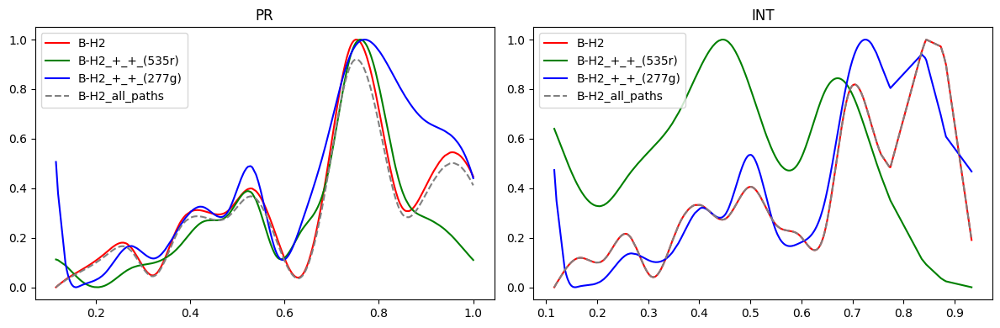

In [75]:
# Plot changes along trajectory
fig, ax = plt.subplots(figsize =(12, 4))
plt.subplot(1, 2, 1)
df_1 = plot_potential(adata, paths_cascade, 'PR', 'B-H2', window=1, gam_smooth=True, return_data = True)
plt.subplot(1, 2, 2)
df_2 = plot_potential(adata, paths_cascade, 'INT', 'B-H2', window=1, gam_smooth=True, return_data = True)
plt.tight_layout()
plt.savefig('/staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/EAD_3/velocity/diff_plot/curve_plots/B-H2.pdf')

/opt/venv/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


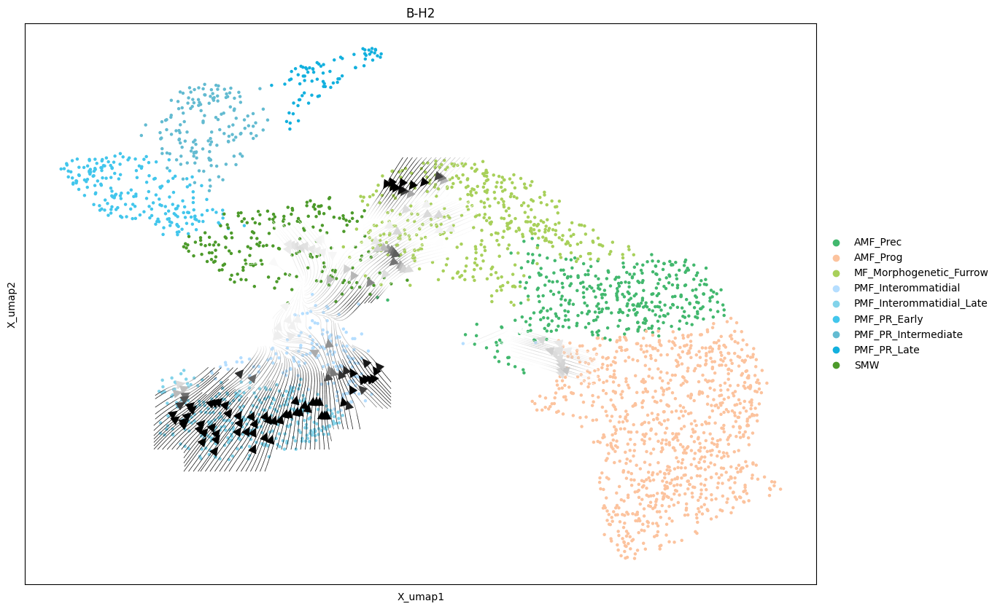

In [76]:
from matplotlib.pyplot import rc_context
with rc_context({'figure.figsize': (14,10)}):
    plot_map(adata, paths_cascade, 'B-H2', color_var='Diff_state', n_grid_cols = 25, n_grid_rows = 25, offset_frac = 0.005,
             tf_traj_thr=0.7, tf_expr_thr=0.2, scale=50, figsize=(14,10), gam_smooth=True, palette={
    "AMF_Prog": "#FCC39E",
    "AMF_Prec": "#42B86E",
    "MF_Morphogenetic_Furrow": "#A8D05A",
    "SMW": "#4C9A2A",
    "PMF_Interommatidial": "#B5DEFF",
    "PMF_Interommatidial_Late": "#82D3EA",
    "PMF_PR_Early": "#42C6EC", 
    "PMF_PR_Intermediate": "#63BBD1",
    "PMF_PR_Late": "#12b0de"
}, save='/staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/EAD_3/velocity/diff_plot/arrow_plots/B-H2.pdf')

/opt/venv/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


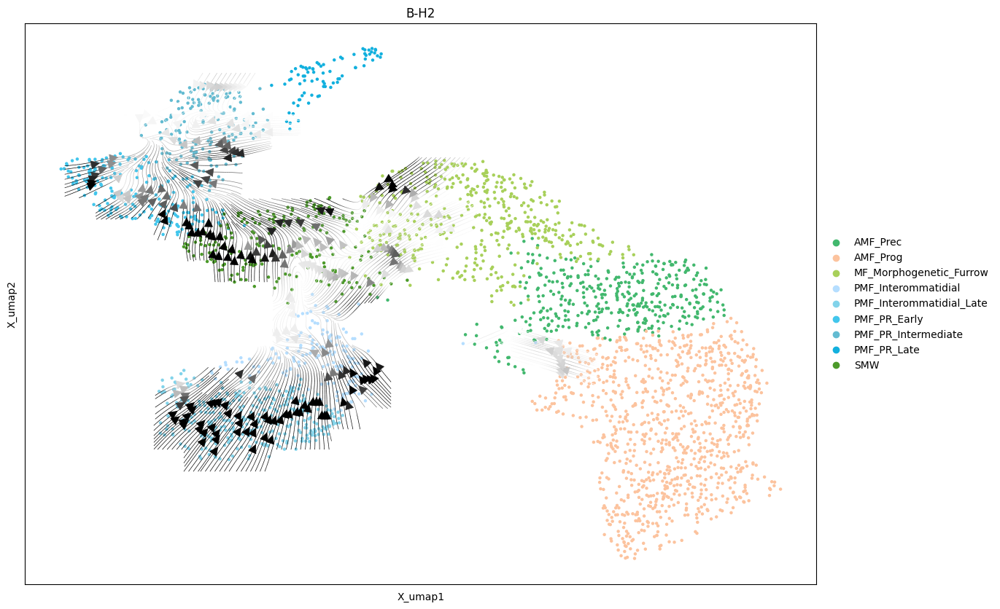

In [77]:
from matplotlib.pyplot import rc_context
with rc_context({'figure.figsize': (14,10)}):
    plot_map(adata, paths_cascade, 'B-H2', color_var='Diff_state', n_grid_cols = 25, n_grid_rows = 25, offset_frac = 0.005,
             tf_traj_thr=0.7, tf_expr_thr=0.2, scale=50, figsize=(14,10), gam_smooth=True, penalization=0.2, palette={
    "AMF_Prog": "#FCC39E",
    "AMF_Prec": "#42B86E",
    "MF_Morphogenetic_Furrow": "#A8D05A",
    "SMW": "#4C9A2A",
    "PMF_Interommatidial": "#B5DEFF",
    "PMF_Interommatidial_Late": "#82D3EA",
    "PMF_PR_Early": "#42C6EC", 
    "PMF_PR_Intermediate": "#63BBD1",
    "PMF_PR_Late": "#12b0de"
}, save='/staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/EAD_3/velocity//diff_plot/arrow_plots/B-H2_less_penal.pdf')

#### 2. BarH1 (INT and R1-6: http://genesdev.cshlp.org/content/6/1/50.long)

/local_scratch/tmp-vsc31305/ipykernel_7864/2260548097.py:3: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, 2, 1)


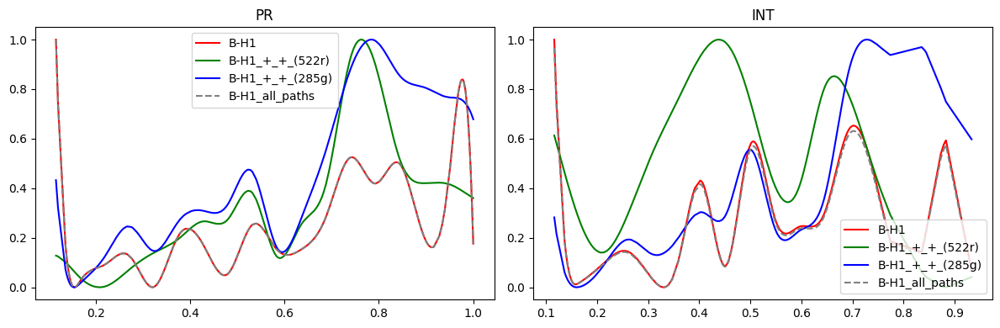

In [78]:
# Plot changes along trajectory
fig, ax = plt.subplots(figsize =(12, 4))
plt.subplot(1, 2, 1)
df_1 = plot_potential(adata, paths_cascade, 'PR', 'B-H1', window=1, gam_smooth=True, return_data = True)
plt.subplot(1, 2, 2)
df_2 = plot_potential(adata, paths_cascade, 'INT', 'B-H1', window=1, gam_smooth=True, return_data = True)
plt.tight_layout()
plt.savefig('/staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/EAD_3/velocity//diff_plot/curve_plots/B-H1.pdf')

/opt/venv/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


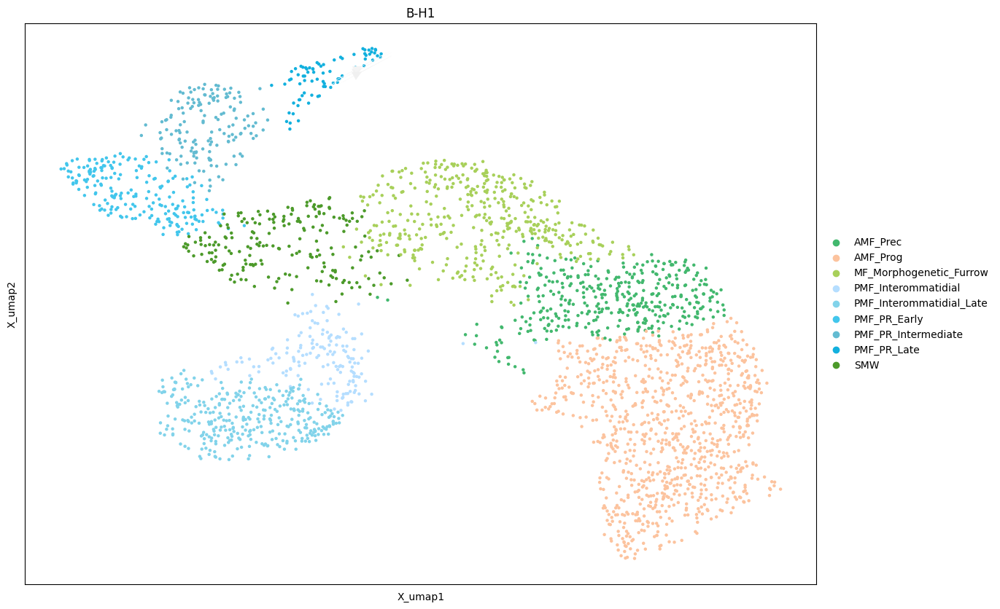

In [79]:
from matplotlib.pyplot import rc_context
with rc_context({'figure.figsize': (14,10)}):
    plot_map(adata, paths_cascade, 'B-H1', color_var='Diff_state', n_grid_cols = 25, n_grid_rows = 25, offset_frac = 0.005,
             tf_traj_thr=0.7, tf_expr_thr=0.2, scale=50, figsize=(14,10), gam_smooth=True, palette={
    "AMF_Prog": "#FCC39E",
    "AMF_Prec": "#42B86E",
    "MF_Morphogenetic_Furrow": "#A8D05A",
    "SMW": "#4C9A2A",
    "PMF_Interommatidial": "#B5DEFF",
    "PMF_Interommatidial_Late": "#82D3EA",
    "PMF_PR_Early": "#42C6EC", 
    "PMF_PR_Intermediate": "#63BBD1",
    "PMF_PR_Late": "#12b0de"
}, save='/staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/EAD_3/velocity//diff_plot/arrow_plots/B-H1.pdf')

#### 3. Glass (PR, and INT?)

/local_scratch/tmp-vsc31305/ipykernel_7864/2187776293.py:3: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, 2, 1)


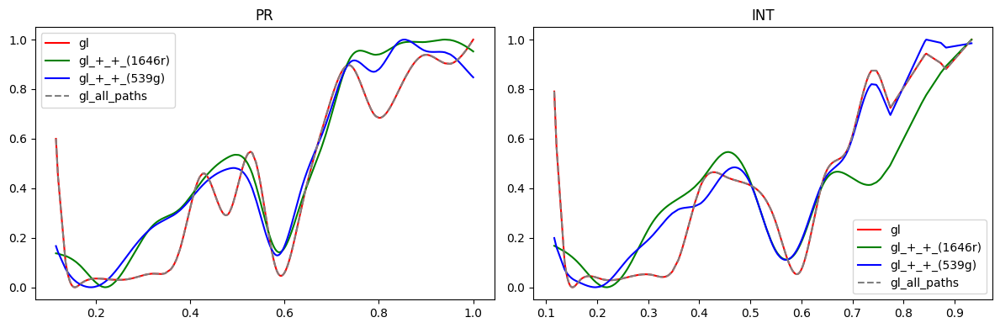

In [80]:
# Plot changes along trajectory
fig, ax = plt.subplots(figsize =(12, 4))
plt.subplot(1, 2, 1)
df_1 = plot_potential(adata, paths_cascade, 'PR', 'gl', window=1, gam_smooth=True, return_data = True)
plt.subplot(1, 2, 2)
df_2 = plot_potential(adata, paths_cascade, 'INT', 'gl', window=1, gam_smooth=True, return_data = True)
plt.tight_layout()
plt.savefig('/staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/EAD_3/velocity//diff_plot/curve_plots/gl.pdf')

/opt/venv/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


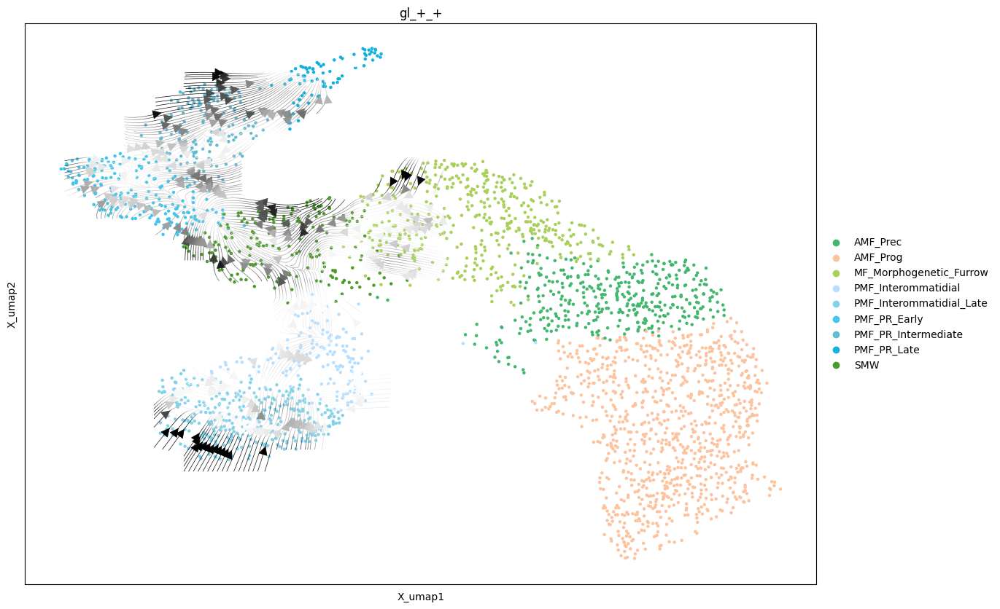

In [81]:
from matplotlib.pyplot import rc_context
with rc_context({'figure.figsize': (14,10)}):
    plot_map(adata, paths_cascade, 'gl_+_+', color_var='Diff_state', n_grid_cols = 25, n_grid_rows = 25, offset_frac = 0.005,
             tf_traj_thr=0.7, tf_expr_thr=0.2, scale=50, figsize=(14,10), gam_smooth=True, penalization=0.5,palette={
    "AMF_Prog": "#FCC39E",
    "AMF_Prec": "#42B86E",
    "MF_Morphogenetic_Furrow": "#A8D05A",
    "SMW": "#4C9A2A",
    "PMF_Interommatidial": "#B5DEFF",
    "PMF_Interommatidial_Late": "#82D3EA",
    "PMF_PR_Early": "#42C6EC", 
    "PMF_PR_Intermediate": "#63BBD1",
    "PMF_PR_Late": "#12b0de"
}, save='/staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/EAD_3/velocity//diff_plot/arrow_plots/gl_+_+.pdf')

#### 4. Ato (MF)

/local_scratch/tmp-vsc31305/ipykernel_7864/774403576.py:3: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, 2, 1)


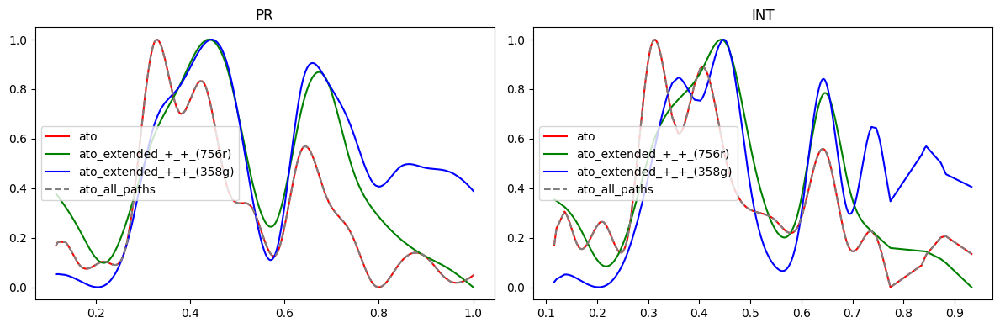

In [82]:
# Plot changes along trajectory
fig, ax = plt.subplots(figsize =(12, 4))
plt.subplot(1, 2, 1)
df_1 = plot_potential(adata, paths_cascade, 'PR', 'ato_extended', window=1, gam_smooth=True, return_data = True)
plt.subplot(1, 2, 2)
df_2 = plot_potential(adata, paths_cascade, 'INT', 'ato_extended', window=1, gam_smooth=True, return_data = True)
plt.tight_layout()
plt.savefig('/staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/EAD_3/velocity//diff_plot/curve_plots/ato.pdf')

/opt/venv/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


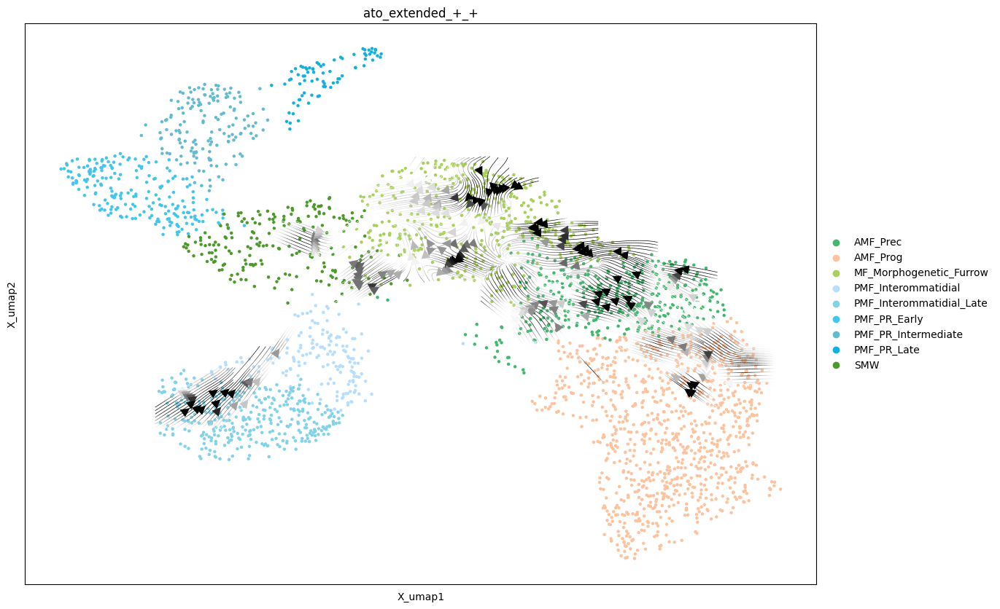

In [83]:
from matplotlib.pyplot import rc_context
with rc_context({'figure.figsize': (14,10)}):
    plot_map(adata, paths_cascade, 'ato_extended_+_+', color_var='Diff_state', n_grid_cols = 25, n_grid_rows = 25, offset_frac = 0.005,
             tf_traj_thr=0.7, tf_expr_thr=0.2, scale=50, figsize=(14,10), gam_smooth=True, penalization=0.5,palette={
    "AMF_Prog": "#FCC39E",
    "AMF_Prec": "#42B86E",
    "MF_Morphogenetic_Furrow": "#A8D05A",
    "SMW": "#4C9A2A",
    "PMF_Interommatidial": "#B5DEFF",
    "PMF_Interommatidial_Late": "#82D3EA",
    "PMF_PR_Early": "#42C6EC", 
    "PMF_PR_Intermediate": "#63BBD1",
    "PMF_PR_Late": "#12b0de"
}, save='/staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/EAD_3/velocity//diff_plot/arrow_plots/ato_+_+.pdf')

#### 5. Lz (INT)

/local_scratch/tmp-vsc31305/ipykernel_7864/870491113.py:3: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, 2, 1)


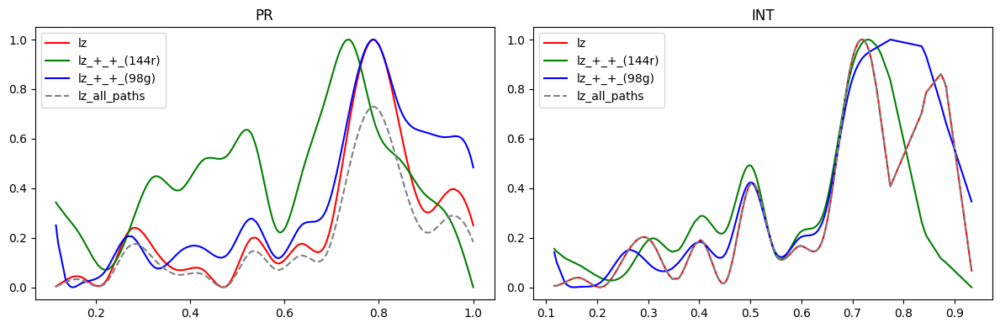

In [84]:
# Plot changes along trajectory
fig, ax = plt.subplots(figsize =(12, 4))
plt.subplot(1, 2, 1)
df_1 = plot_potential(adata, paths_cascade, 'PR', 'lz', window=1, gam_smooth=True, return_data = True)
plt.subplot(1, 2, 2)
df_2 = plot_potential(adata, paths_cascade, 'INT', 'lz', window=1, gam_smooth=True, return_data = True)
plt.tight_layout()
plt.savefig('/staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/EAD_3/velocity//diff_plot/curve_plots/lz.pdf')

/opt/venv/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


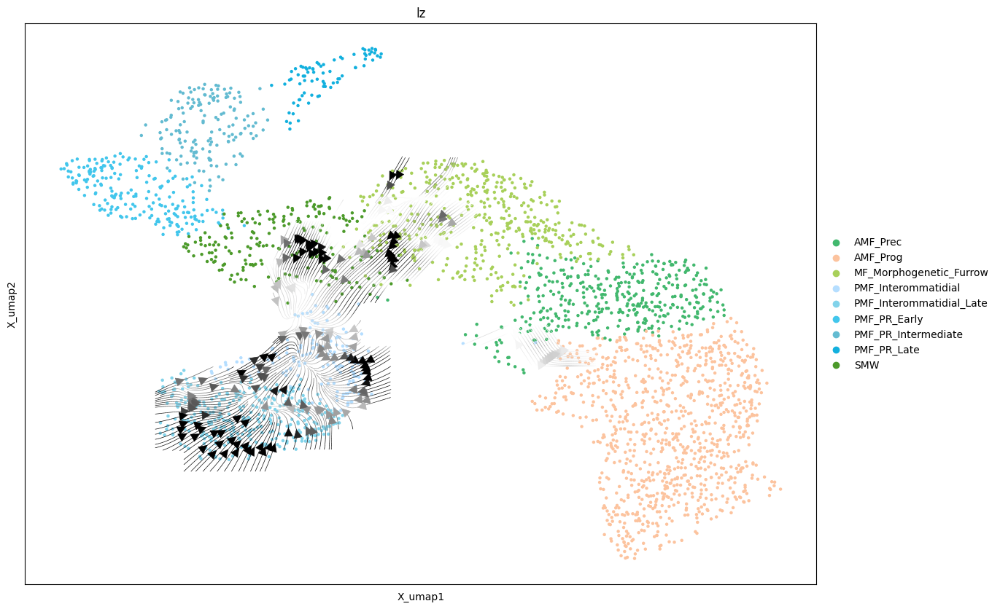

In [85]:
from matplotlib.pyplot import rc_context
with rc_context({'figure.figsize': (14,10)}):
    plot_map(adata, paths_cascade, 'lz', color_var='Diff_state', n_grid_cols = 25, n_grid_rows = 25, offset_frac = 0.005,
             tf_traj_thr=0.7, tf_expr_thr=0.2, scale=50, figsize=(14,10), gam_smooth=True, palette={
    "AMF_Prog": "#FCC39E",
    "AMF_Prec": "#42B86E",
    "MF_Morphogenetic_Furrow": "#A8D05A",
    "SMW": "#4C9A2A",
    "PMF_Interommatidial": "#B5DEFF",
    "PMF_Interommatidial_Late": "#82D3EA",
    "PMF_PR_Early": "#42C6EC", 
    "PMF_PR_Intermediate": "#63BBD1",
    "PMF_PR_Late": "#12b0de"
}, save='/staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/EAD_3/velocity//diff_plot/arrow_plots/lz+.pdf')

#### 6. Lola (PR)

/local_scratch/tmp-vsc31305/ipykernel_7864/2927775336.py:3: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, 2, 1)


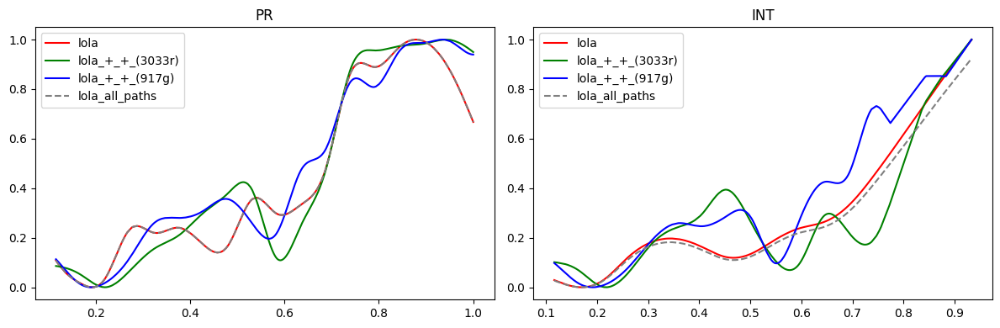

In [86]:
# Plot changes along trajectory
fig, ax = plt.subplots(figsize =(12, 4))
plt.subplot(1, 2, 1)
df_1 = plot_potential(adata, paths_cascade, 'PR', 'lola', window=1, gam_smooth=True, return_data = True)
plt.subplot(1, 2, 2)
df_2 = plot_potential(adata, paths_cascade, 'INT', 'lola', window=1, gam_smooth=True, return_data = True)
plt.tight_layout()
plt.savefig('/staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/EAD_3/velocity//diff_plot/curve_plots/lola.pdf')

/opt/venv/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


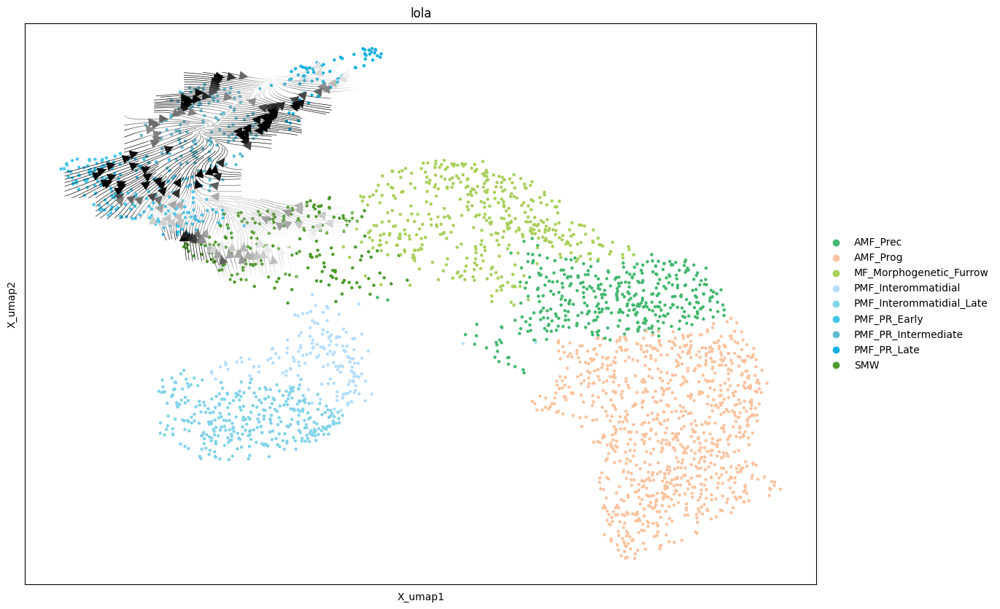

In [87]:
from matplotlib.pyplot import rc_context
with rc_context({'figure.figsize': (14,10)}):
    plot_map(adata, paths_cascade, 'lola', color_var='Diff_state', n_grid_cols = 25, n_grid_rows = 25, offset_frac = 0.005,
             tf_traj_thr=0.7, tf_expr_thr=0.2, scale=50, figsize=(14,10), gam_smooth=True, palette={
    "AMF_Prog": "#FCC39E",
    "AMF_Prec": "#42B86E",
    "MF_Morphogenetic_Furrow": "#A8D05A",
    "SMW": "#4C9A2A",
    "PMF_Interommatidial": "#B5DEFF",
    "PMF_Interommatidial_Late": "#82D3EA",
    "PMF_PR_Early": "#42C6EC", 
    "PMF_PR_Intermediate": "#63BBD1",
    "PMF_PR_Late": "#12b0de"
}, save='/staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/EAD_3/velocity//diff_plot/arrow_plots/lola.pdf')

#### 7. Optix (Progenitors/Precursors)

/local_scratch/tmp-vsc31305/ipykernel_7864/432201085.py:3: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, 2, 1)


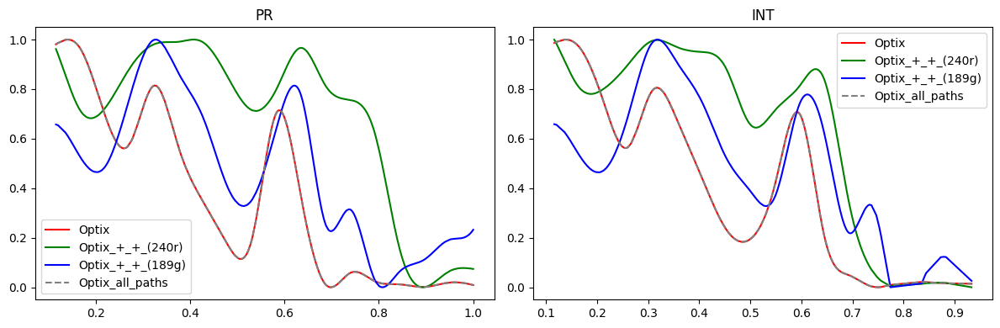

In [88]:
# Plot changes along trajectory
fig, ax = plt.subplots(figsize =(12, 4))
plt.subplot(1, 2, 1)
df_1 = plot_potential(adata, paths_cascade, 'PR', 'Optix', window=1, gam_smooth=True, return_data = True)
plt.subplot(1, 2, 2)
df_2 = plot_potential(adata, paths_cascade, 'INT', 'Optix', window=1, gam_smooth=True, return_data = True)
plt.tight_layout()
plt.savefig('/staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/EAD_3/velocity//diff_plot/curve_plots/Optix.pdf')

/opt/venv/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


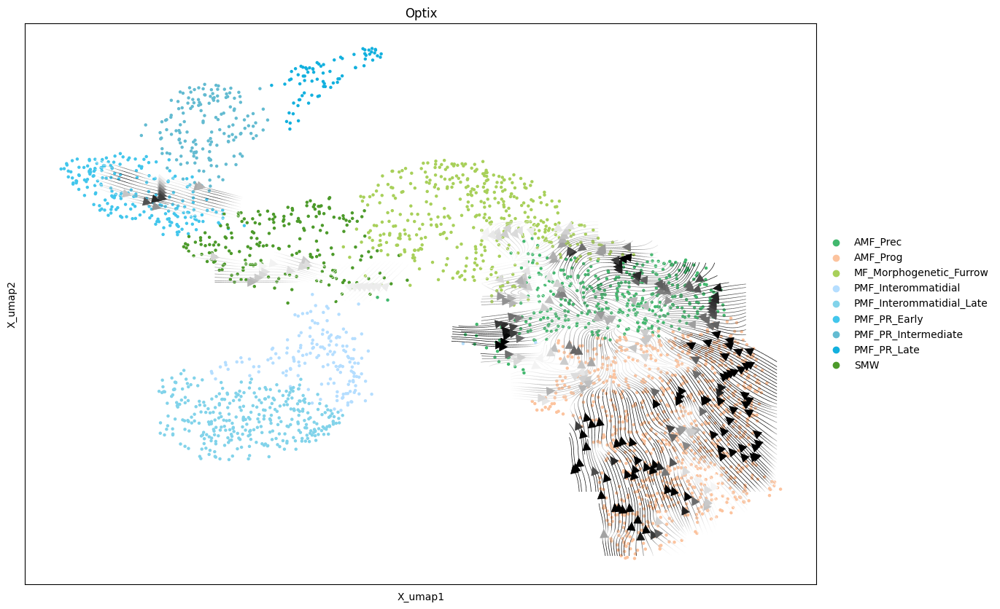

In [89]:
from matplotlib.pyplot import rc_context
with rc_context({'figure.figsize': (14,10)}):
    plot_map(adata, paths_cascade, 'Optix', color_var='Diff_state', n_grid_cols = 25, n_grid_rows = 25, offset_frac = 0.005,
             tf_traj_thr=0.7, tf_expr_thr=0.2, scale=50, figsize=(14,10), gam_smooth=True, palette={
    "AMF_Prog": "#FCC39E",
    "AMF_Prec": "#42B86E",
    "MF_Morphogenetic_Furrow": "#A8D05A",
    "SMW": "#4C9A2A",
    "PMF_Interommatidial": "#B5DEFF",
    "PMF_Interommatidial_Late": "#82D3EA",
    "PMF_PR_Early": "#42C6EC", 
    "PMF_PR_Intermediate": "#63BBD1",
    "PMF_PR_Late": "#12b0de"
}, save='/staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/EAD_3/velocity//diff_plot/arrow_plots/Optix_thr_low.pdf')

#### 8. Ase (PR early)

/local_scratch/tmp-vsc31305/ipykernel_7864/2919125312.py:3: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, 2, 1)


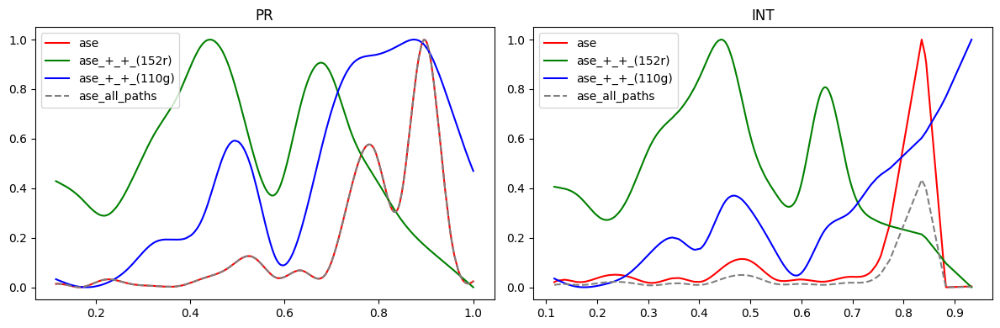

In [90]:
# Plot changes along trajectory
fig, ax = plt.subplots(figsize =(12, 4))
plt.subplot(1, 2, 1)
df_1 = plot_potential(adata, paths_cascade, 'PR', 'ase', window=1, gam_smooth=True, return_data = True)
plt.subplot(1, 2, 2)
df_2 = plot_potential(adata, paths_cascade, 'INT', 'ase', window=1, gam_smooth=True, return_data = True)
plt.tight_layout()
plt.savefig('/staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/EAD_3/velocity//diff_plot/curve_plots/ase.pdf')

/opt/venv/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


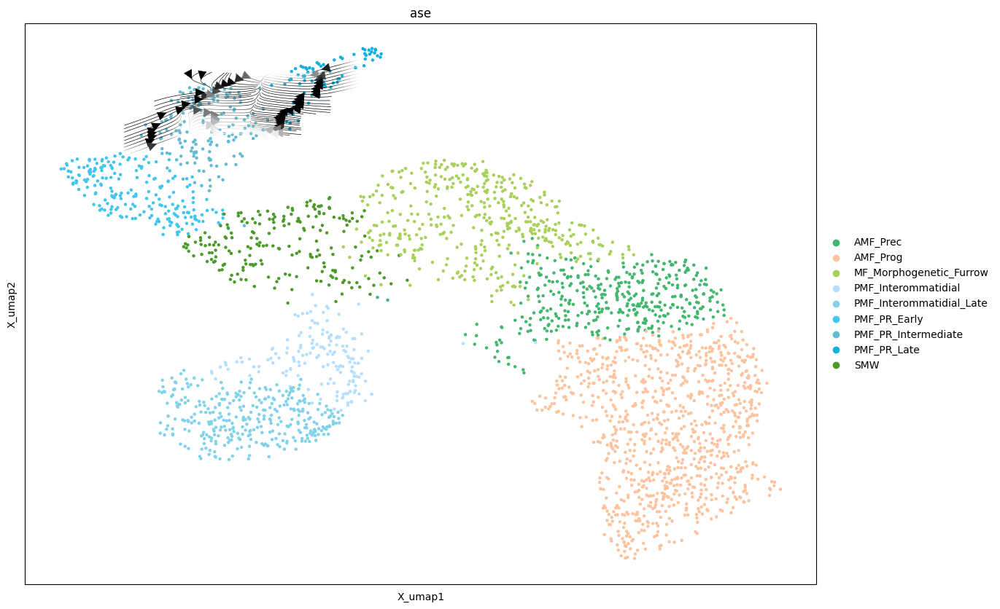

In [91]:
from matplotlib.pyplot import rc_context
with rc_context({'figure.figsize': (14,10)}):
    plot_map(adata, paths_cascade, 'ase', color_var='Diff_state', n_grid_cols = 25, n_grid_rows = 25, offset_frac = 0.005,
             tf_traj_thr=0.8, tf_expr_thr=0.8, scale=50, figsize=(14,10), gam_smooth=True, penalization=0.01, palette={
    "AMF_Prog": "#FCC39E",
    "AMF_Prec": "#42B86E",
    "MF_Morphogenetic_Furrow": "#A8D05A",
    "SMW": "#4C9A2A",
    "PMF_Interommatidial": "#B5DEFF",
    "PMF_Interommatidial_Late": "#82D3EA",
    "PMF_PR_Early": "#42C6EC", 
    "PMF_PR_Intermediate": "#63BBD1",
    "PMF_PR_Late": "#12b0de"
}, save='/staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/EAD_3/velocity//diff_plot/arrow_plots/ase.pdf')

#### 9. Ro (PR early)

/local_scratch/tmp-vsc31305/ipykernel_7864/1941722923.py:3: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, 2, 1)


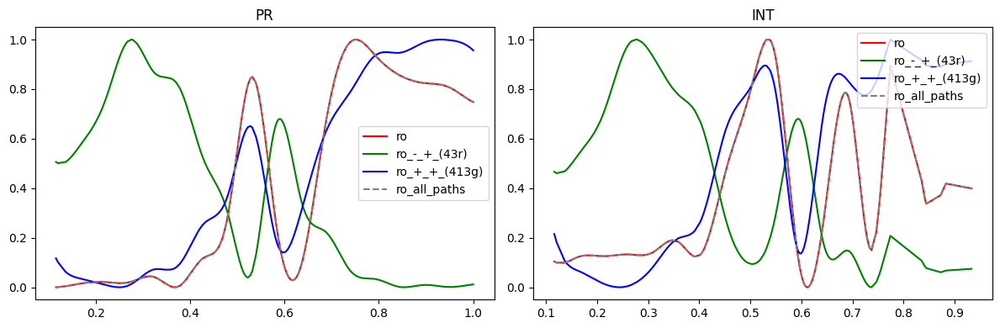

In [92]:
# Plot changes along trajectory
fig, ax = plt.subplots(figsize =(12, 4))
plt.subplot(1, 2, 1)
df_1 = plot_potential(adata, paths_cascade, 'PR', 'ro', window=300, gam_smooth=True, return_data = True)
plt.subplot(1, 2, 2)
df_2 = plot_potential(adata, paths_cascade, 'INT', 'ro', window=300, gam_smooth=True, return_data = True)
plt.tight_layout()
plt.savefig('/staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/EAD_3/velocity//diff_plot/curve_plots/ro.pdf')

/opt/venv/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


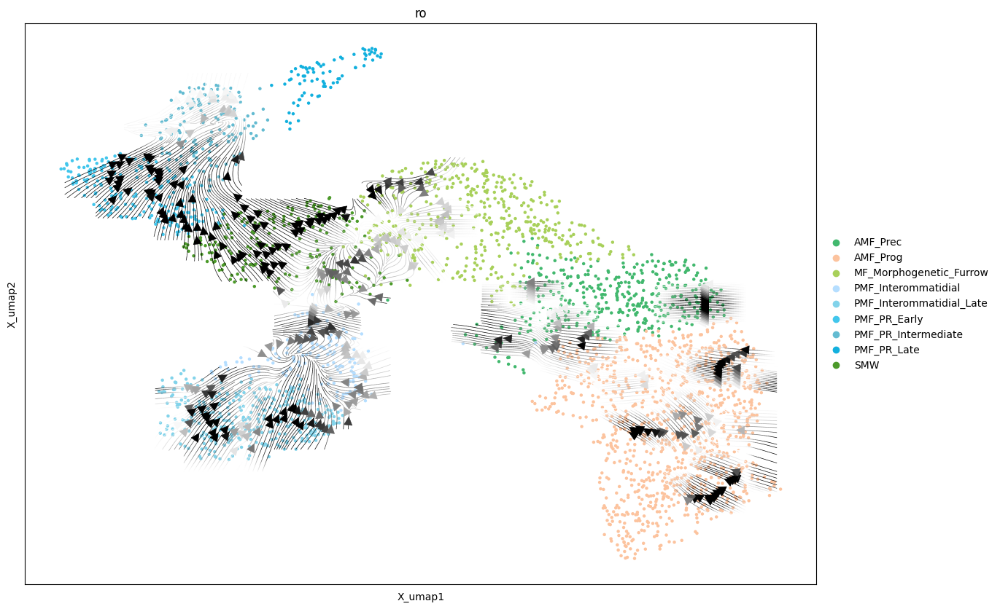

In [93]:
from matplotlib.pyplot import rc_context
with rc_context({'figure.figsize': (14,10)}):
    plot_map(adata, paths_cascade, 'ro', color_var='Diff_state', n_grid_cols = 25, n_grid_rows = 25, offset_frac = 0.005,
             tf_traj_thr=0.7, tf_expr_thr=0.2, scale=50, figsize=(14,10), gam_smooth=True, window=300, palette={
    "AMF_Prog": "#FCC39E",
    "AMF_Prec": "#42B86E",
    "MF_Morphogenetic_Furrow": "#A8D05A",
    "SMW": "#4C9A2A",
    "PMF_Interommatidial": "#B5DEFF",
    "PMF_Interommatidial_Late": "#82D3EA",
    "PMF_PR_Early": "#42C6EC", 
    "PMF_PR_Intermediate": "#63BBD1",
    "PMF_PR_Late": "#12b0de"
}, save='/staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/EAD_3/velocity//diff_plot/arrow_plots/ro.pdf')

#### 10. Onecut (PR late)

/local_scratch/tmp-vsc31305/ipykernel_7864/518137891.py:3: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, 2, 1)


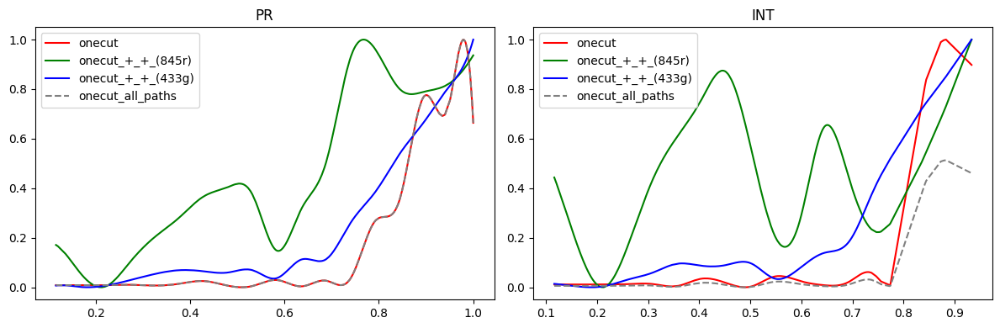

In [94]:
# Plot changes along trajectory
fig, ax = plt.subplots(figsize =(12, 4))
plt.subplot(1, 2, 1)
df_1 = plot_potential(adata, paths_cascade, 'PR', 'onecut', window=1, gam_smooth=True, return_data = True)
plt.subplot(1, 2, 2)
df_2 = plot_potential(adata, paths_cascade, 'INT', 'onecut', window=1, gam_smooth=True, return_data = True)
plt.tight_layout()
plt.savefig('/staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/EAD_3/velocity//diff_plot/curve_plots/onecut.pdf')

/opt/venv/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


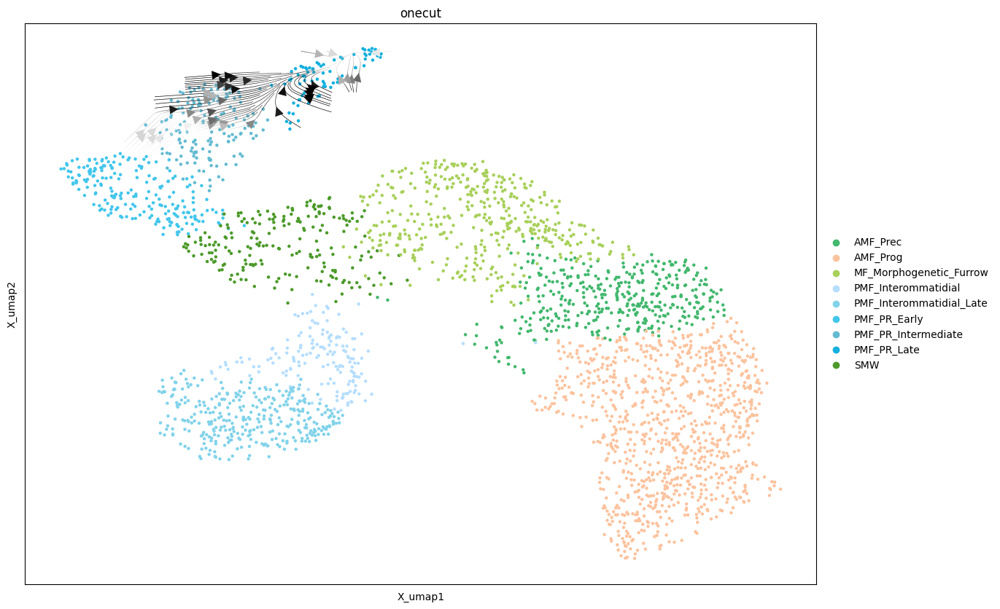

In [95]:
from matplotlib.pyplot import rc_context
with rc_context({'figure.figsize': (14,10)}):
    plot_map(adata, paths_cascade, 'onecut', color_var='Diff_state', n_grid_cols = 25, n_grid_rows = 25, offset_frac = 0.005,
             tf_traj_thr=0.7, tf_expr_thr=0.2, scale=50, figsize=(14,10), gam_smooth=True,  palette={
    "AMF_Prog": "#FCC39E",
    "AMF_Prec": "#42B86E",
    "MF_Morphogenetic_Furrow": "#A8D05A",
    "SMW": "#4C9A2A",
    "PMF_Interommatidial": "#B5DEFF",
    "PMF_Interommatidial_Late": "#82D3EA",
    "PMF_PR_Early": "#42C6EC", 
    "PMF_PR_Intermediate": "#63BBD1",
    "PMF_PR_Late": "#12b0de"
}, save='/staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/EAD_3/velocity//diff_plot/arrow_plots/onecut.pdf')

#### 11. Ey (Precursors)

/local_scratch/tmp-vsc31305/ipykernel_7864/1271941172.py:3: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, 2, 1)


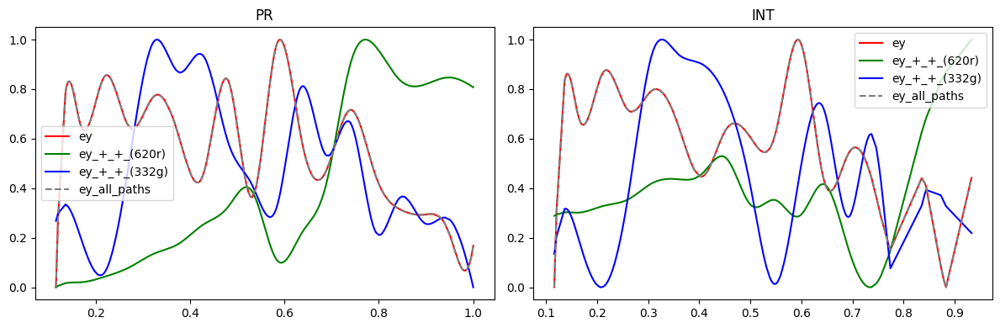

In [96]:
# Plot changes along trajectory
fig, ax = plt.subplots(figsize =(12, 4))
plt.subplot(1, 2, 1)
df_1 = plot_potential(adata, paths_cascade, 'PR', 'ey', window=1, gam_smooth=True, return_data = True)
plt.subplot(1, 2, 2)
df_2 = plot_potential(adata, paths_cascade, 'INT', 'ey', window=1, gam_smooth=True, return_data = True)
plt.tight_layout()
plt.savefig('/staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/EAD_3/velocity//diff_plot/curve_plots/ey.pdf')

/opt/venv/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


OSError: [Errno 107] Transport endpoint is not connected: '/opt/venv/lib/python3.8/site-packages/matplotlib/mpl-data/fonts/ttf/DejaVuSans.ttf'

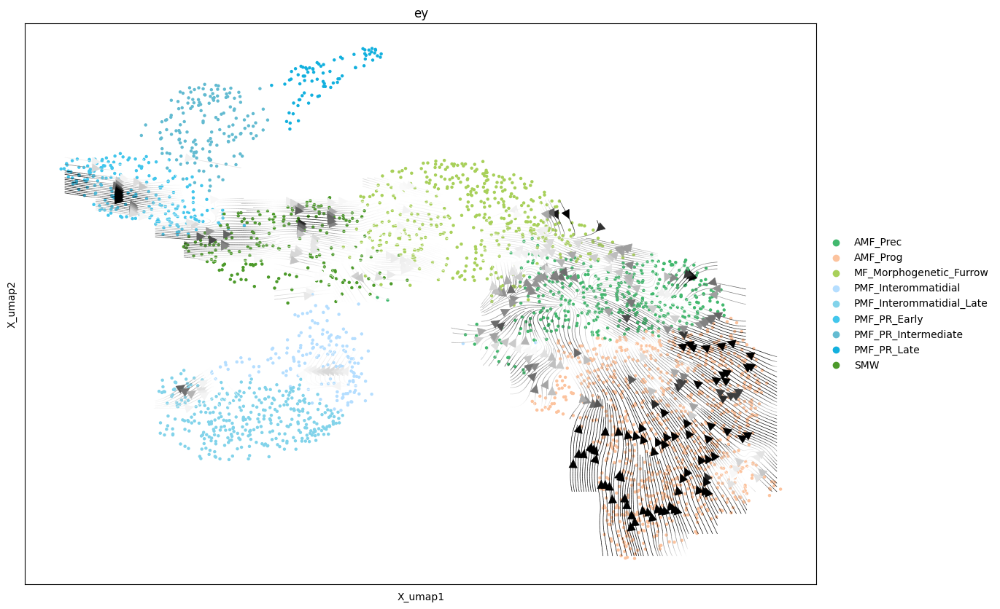

In [123]:
from matplotlib.pyplot import rc_context
with rc_context({'figure.figsize': (14,10)}):
    plot_map(adata, paths_cascade, 'ey', color_var='Diff_state', n_grid_cols = 25, n_grid_rows = 25, offset_frac = 0.005,
             tf_traj_thr=0.6, tf_expr_thr=0.4, scale=50, figsize=(14,10), gam_smooth=True,  palette={
    "AMF_Prog": "#FCC39E",
    "AMF_Prec": "#42B86E",
    "MF_Morphogenetic_Furrow": "#A8D05A",
    "SMW": "#4C9A2A",
    "PMF_Interommatidial": "#B5DEFF",
    "PMF_Interommatidial_Late": "#82D3EA",
    "PMF_PR_Early": "#42C6EC", 
    "PMF_PR_Intermediate": "#63BBD1",
    "PMF_PR_Late": "#12b0de"
}, save='/staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/EAD_3/velocity//diff_plot/arrow_plots/ey_low_thr.pdf')

#### 12. Rn (MF)

/local_scratch/tmp-vsc31305/ipykernel_7864/4034969744.py:3: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, 2, 1)


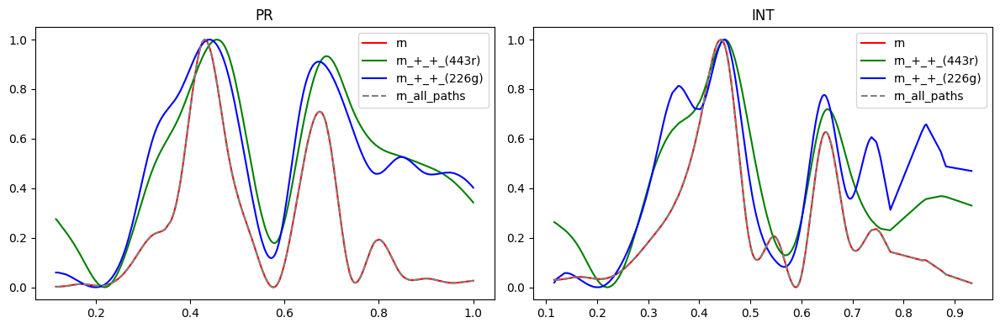

In [98]:
# Plot changes along trajectory
fig, ax = plt.subplots(figsize =(12, 4))
plt.subplot(1, 2, 1)
df_1 = plot_potential(adata, paths_cascade, 'PR', 'rn', window=1, gam_smooth=True, return_data = True)
plt.subplot(1, 2, 2)
df_2 = plot_potential(adata, paths_cascade, 'INT', 'rn', window=1, gam_smooth=True, return_data = True)
plt.tight_layout()
plt.savefig('/staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/EAD_3/velocity//diff_plot/curve_plots/rn.pdf')

/opt/venv/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


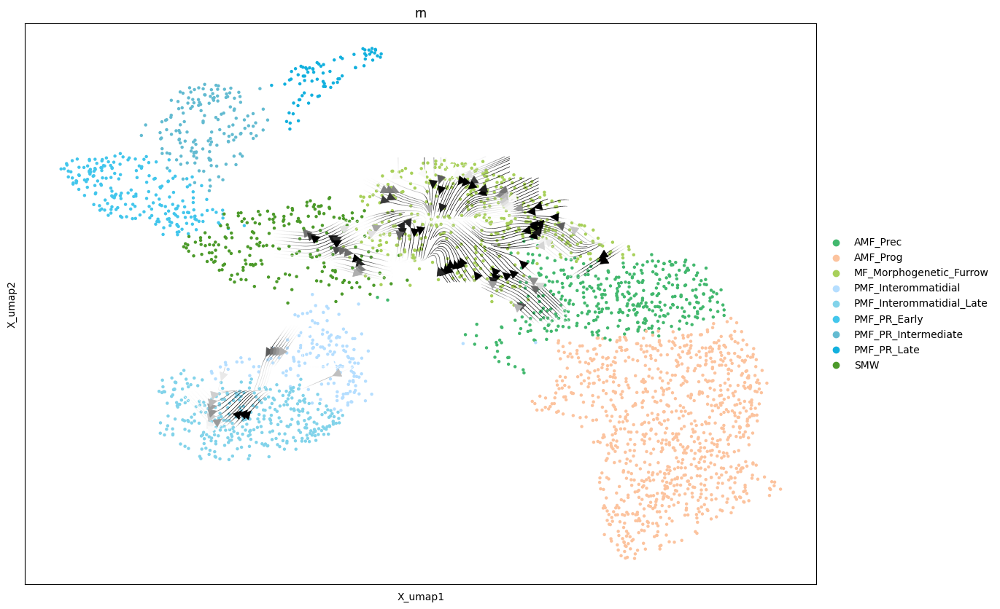

In [99]:
from matplotlib.pyplot import rc_context
with rc_context({'figure.figsize': (14,10)}):
    plot_map(adata, paths_cascade, 'rn', color_var='Diff_state', n_grid_cols = 25, n_grid_rows = 25, offset_frac = 0.005,
             tf_traj_thr=0.9, tf_expr_thr=0.2, scale=50, figsize=(14,10), gam_smooth=True,  palette={
    "AMF_Prog": "#FCC39E",
    "AMF_Prec": "#42B86E",
    "MF_Morphogenetic_Furrow": "#A8D05A",
    "SMW": "#4C9A2A",
    "PMF_Interommatidial": "#B5DEFF",
    "PMF_Interommatidial_Late": "#82D3EA",
    "PMF_PR_Early": "#42C6EC", 
    "PMF_PR_Intermediate": "#63BBD1",
    "PMF_PR_Late": "#12b0de"
}, save='/staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/EAD_3/atac/scenicplus_v2/diff_plot/arrow_plots/rn.pdf')

#### 13. svp (PR)

/local_scratch/tmp-vsc31305/ipykernel_7864/2655227411.py:3: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, 2, 1)


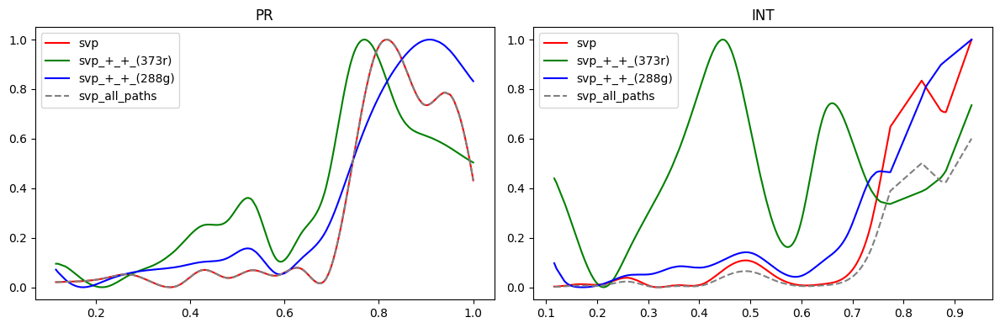

In [100]:
# Plot changes along trajectory
fig, ax = plt.subplots(figsize =(12, 4))
plt.subplot(1, 2, 1)
df_1 = plot_potential(adata, paths_cascade, 'PR', 'svp', window=1, gam_smooth=True, return_data = True)
plt.subplot(1, 2, 2)
df_2 = plot_potential(adata, paths_cascade, 'INT', 'svp', window=1, gam_smooth=True, return_data = True)
plt.tight_layout()
plt.savefig('/staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/EAD_3/velocity//diff_plot/curve_plots/svp.pdf')

/opt/venv/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


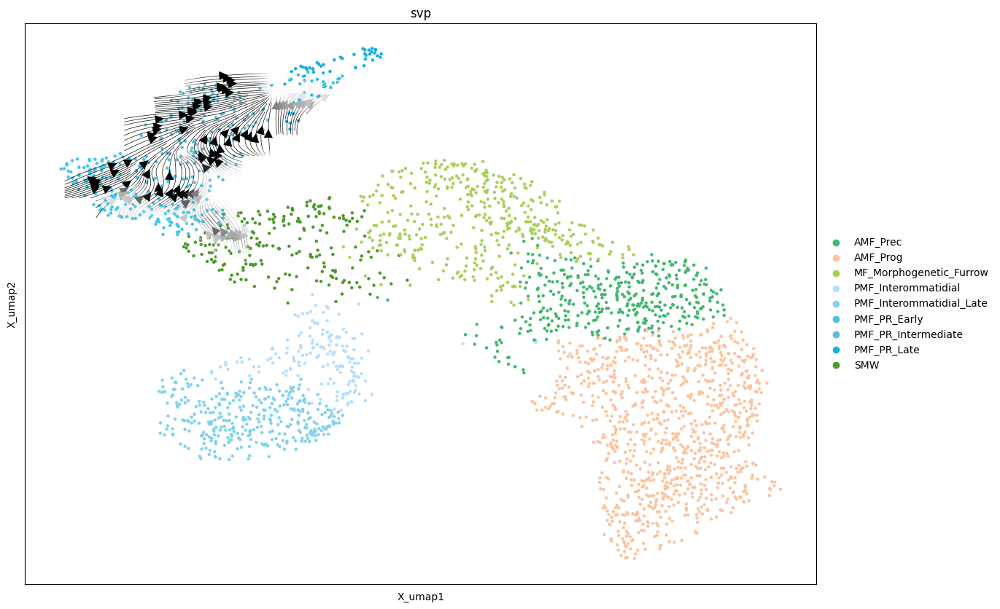

In [101]:
from matplotlib.pyplot import rc_context
with rc_context({'figure.figsize': (14,10)}):
    plot_map(adata, paths_cascade, 'svp', color_var='Diff_state', n_grid_cols = 25, n_grid_rows = 25, offset_frac = 0.005,
             tf_traj_thr=0.7, tf_expr_thr=0.2, scale=50, figsize=(14,10), gam_smooth=True,  palette={
    "AMF_Prog": "#FCC39E",
    "AMF_Prec": "#42B86E",
    "MF_Morphogenetic_Furrow": "#A8D05A",
    "SMW": "#4C9A2A",
    "PMF_Interommatidial": "#B5DEFF",
    "PMF_Interommatidial_Late": "#82D3EA",
    "PMF_PR_Early": "#42C6EC", 
    "PMF_PR_Intermediate": "#63BBD1",
    "PMF_PR_Late": "#12b0de"
}, save='/staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/EAD_3/velocity//diff_plot/arrow_plots/svp.pdf')

#### 14. sens (R8)

/local_scratch/tmp-vsc31305/ipykernel_7864/4288209205.py:3: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, 2, 1)


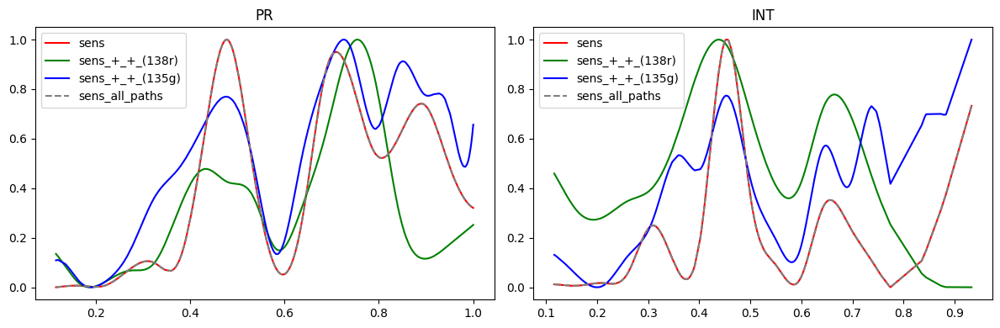

In [102]:
# Plot changes along trajectory
fig, ax = plt.subplots(figsize =(12, 4))
plt.subplot(1, 2, 1)
df_1 = plot_potential(adata, paths_cascade, 'PR', 'sens_+_+', window=1, gam_smooth=True, return_data = True)
plt.subplot(1, 2, 2)
df_2 = plot_potential(adata, paths_cascade, 'INT', 'sens_+_+', window=1, gam_smooth=True, return_data = True)
plt.tight_layout()
plt.savefig('/staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/EAD_3/velocity//diff_plot/curve_plots/sens.pdf')

/opt/venv/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


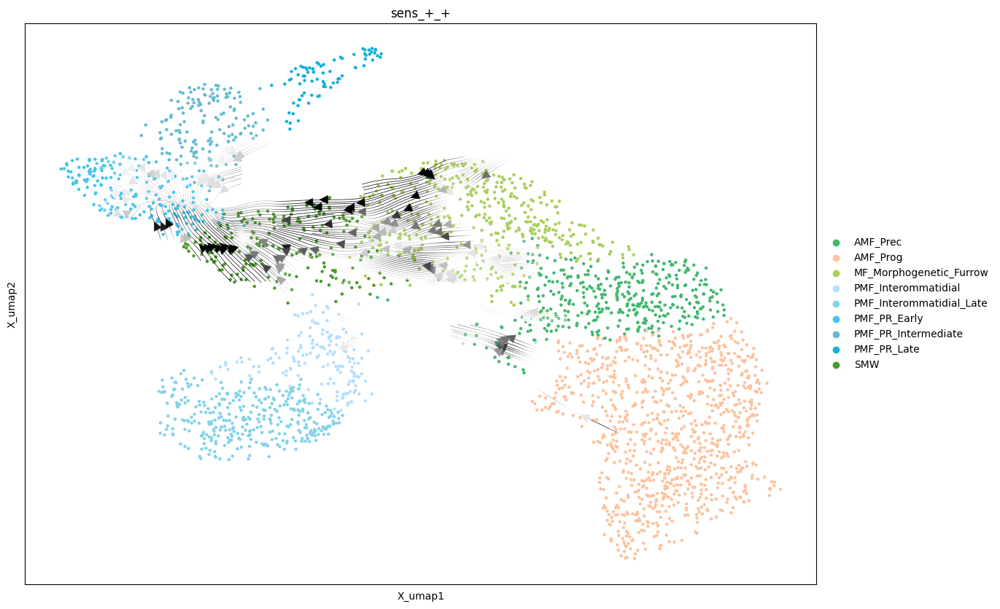

In [114]:
from matplotlib.pyplot import rc_context
with rc_context({'figure.figsize': (14,10)}):
    plot_map(adata, paths_cascade, 'sens_+_+', color_var='Diff_state', n_grid_cols = 25, n_grid_rows = 25, offset_frac = 0.005,
             tf_traj_thr=0.93, tf_expr_thr=0.2, scale=50, figsize=(14,10), gam_smooth=True,  palette={
    "AMF_Prog": "#FCC39E",
    "AMF_Prec": "#42B86E",
    "MF_Morphogenetic_Furrow": "#A8D05A",
    "SMW": "#4C9A2A",
    "PMF_Interommatidial": "#B5DEFF",
    "PMF_Interommatidial_Late": "#82D3EA",
    "PMF_PR_Early": "#42C6EC", 
    "PMF_PR_Intermediate": "#63BBD1",
    "PMF_PR_Late": "#12b0de"
}, save='/staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/EAD_3/velocity//diff_plot/arrow_plots/sens.pdf')

#### 15. Bgb (INT)

/local_scratch/tmp-vsc31305/ipykernel_7864/3303516191.py:3: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, 2, 1)


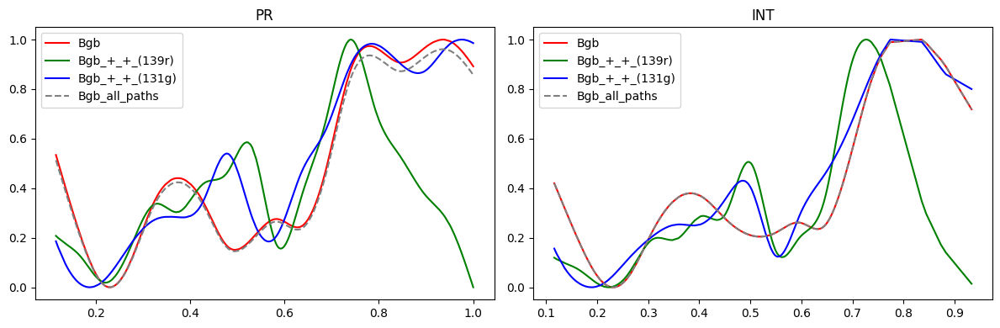

In [104]:
# Plot changes along trajectory
fig, ax = plt.subplots(figsize =(12, 4))
plt.subplot(1, 2, 1)
df_1 = plot_potential(adata, paths_cascade, 'PR', 'Bgb', window=1, gam_smooth=True, return_data = True)
plt.subplot(1, 2, 2)
df_2 = plot_potential(adata, paths_cascade, 'INT', 'Bgb', window=1, gam_smooth=True, return_data = True)
plt.tight_layout()
plt.savefig('/staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/EAD_3/velocity//diff_plot/curve_plots/Bgb.pdf')

/opt/venv/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


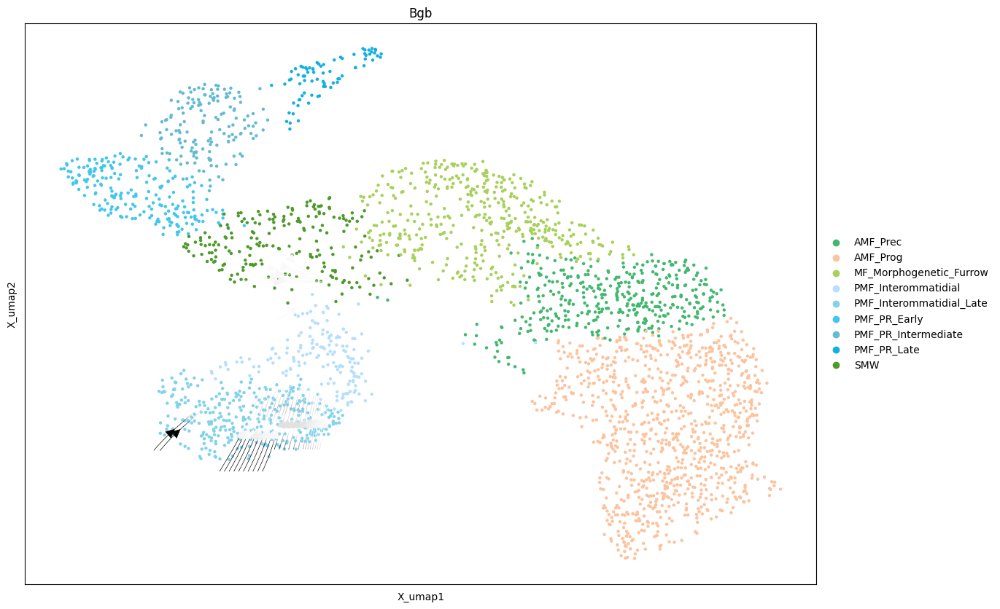

In [105]:
from matplotlib.pyplot import rc_context
with rc_context({'figure.figsize': (14,10)}):
    plot_map(adata, paths_cascade, 'Bgb', color_var='Diff_state', n_grid_cols = 25, n_grid_rows = 25, offset_frac = 0.005,
             tf_traj_thr=0.7, tf_expr_thr=0.2, scale=50, figsize=(14,10), gam_smooth=True,  palette={
    "AMF_Prog": "#FCC39E",
    "AMF_Prec": "#42B86E",
    "MF_Morphogenetic_Furrow": "#A8D05A",
    "SMW": "#4C9A2A",
    "PMF_Interommatidial": "#B5DEFF",
    "PMF_Interommatidial_Late": "#82D3EA",
    "PMF_PR_Early": "#42C6EC", 
    "PMF_PR_Intermediate": "#63BBD1",
    "PMF_PR_Late": "#12b0de"
}, save='/staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/EAD_3/velocity//diff_plot/arrow_plots/Bgb.pdf')

## Toy

/local_scratch/tmp-vsc31305/ipykernel_7864/2396571651.py:3: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, 2, 1)


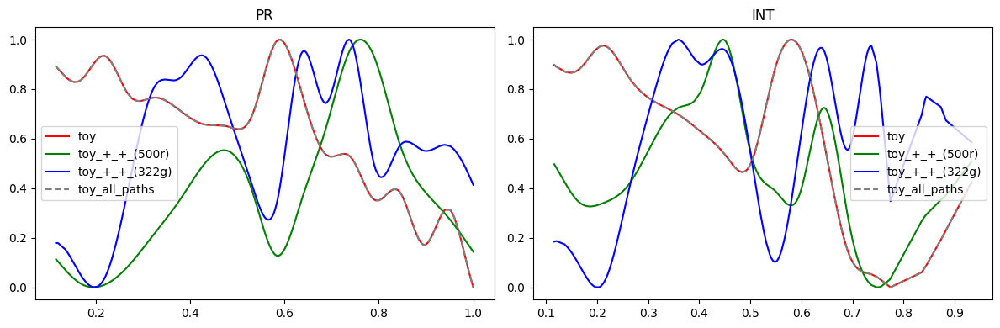

In [106]:
# Plot changes along trajectory
fig, ax = plt.subplots(figsize =(12, 4))
plt.subplot(1, 2, 1)
df_1 = plot_potential(adata, paths_cascade, 'PR', 'toy_+_+', window=1, gam_smooth=True, return_data = True)
plt.subplot(1, 2, 2)
df_2 = plot_potential(adata, paths_cascade, 'INT', 'toy_+_+', window=1, gam_smooth=True, return_data = True)
plt.tight_layout()
plt.savefig('/staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/EAD_3/velocity//diff_plot/curve_plots/toy.pdf')

/opt/venv/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


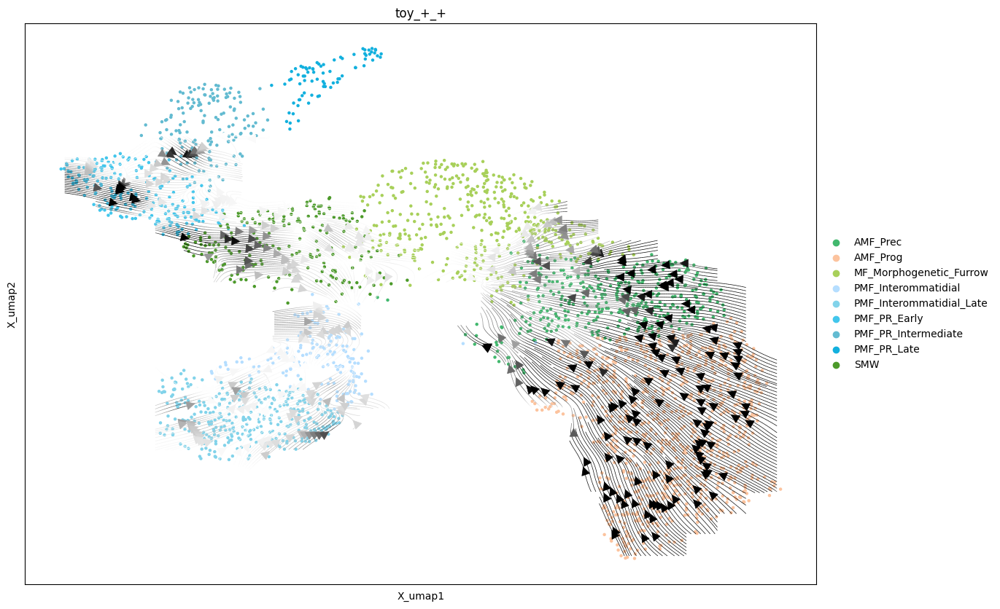

In [107]:
from matplotlib.pyplot import rc_context
with rc_context({'figure.figsize': (14,10)}):
    plot_map(adata, paths_cascade, 'toy_+_+', color_var='Diff_state', n_grid_cols = 25, n_grid_rows = 25, offset_frac = 0.005,
             tf_traj_thr=0.8, tf_expr_thr=0.2, scale=50, figsize=(14,10), gam_smooth=True,  palette={
    "AMF_Prog": "#FCC39E",
    "AMF_Prec": "#42B86E",
    "MF_Morphogenetic_Furrow": "#A8D05A",
    "SMW": "#4C9A2A",
    "PMF_Interommatidial": "#B5DEFF",
    "PMF_Interommatidial_Late": "#82D3EA",
    "PMF_PR_Early": "#42C6EC", 
    "PMF_PR_Intermediate": "#63BBD1",
    "PMF_PR_Late": "#12b0de"
}, save='/staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/EAD_3/velocity//diff_plot/arrow_plots/toy_low_thr.pdf')

## so

/local_scratch/tmp-vsc31305/ipykernel_7864/3606997205.py:3: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, 2, 1)


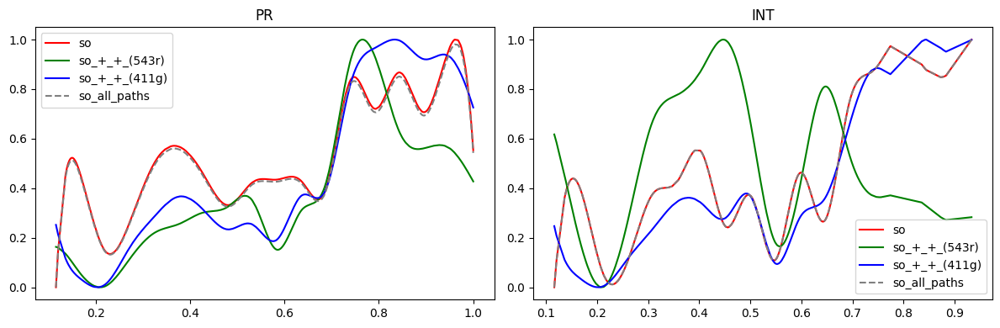

In [108]:
# Plot changes along trajectory
fig, ax = plt.subplots(figsize =(12, 4))
plt.subplot(1, 2, 1)
df_1 = plot_potential(adata, paths_cascade, 'PR', 'so_+_+', window=1, gam_smooth=True, return_data = True)
plt.subplot(1, 2, 2)
df_2 = plot_potential(adata, paths_cascade, 'INT', 'so_+_+', window=1, gam_smooth=True, return_data = True)
plt.tight_layout()
plt.savefig('/staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/EAD_3/velocity//diff_plot/curve_plots/so.pdf')

/opt/venv/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


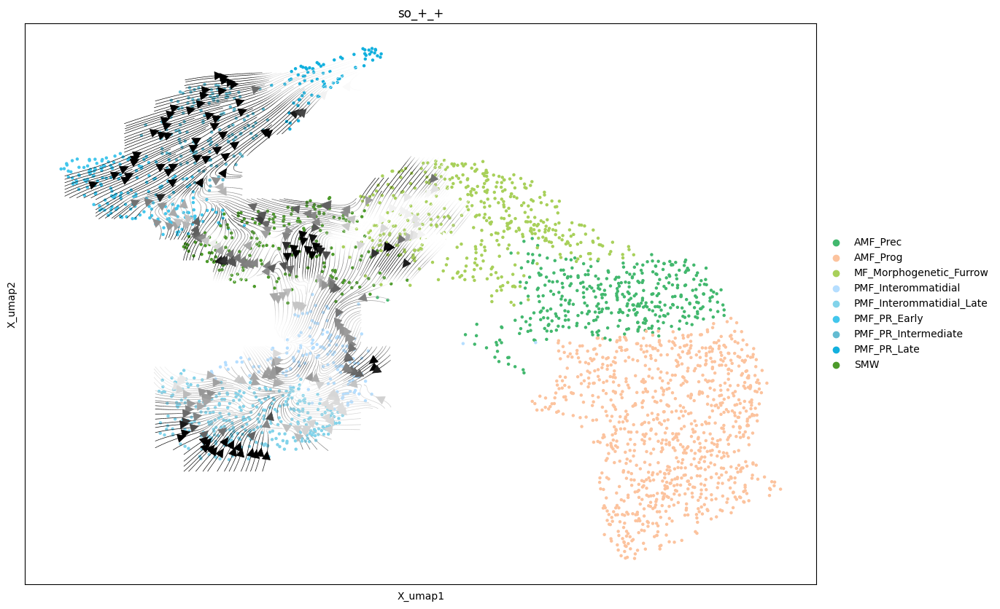

In [109]:
from matplotlib.pyplot import rc_context
with rc_context({'figure.figsize': (14,10)}):
    plot_map(adata, paths_cascade, 'so_+_+', color_var='Diff_state', n_grid_cols = 25, n_grid_rows = 25, offset_frac = 0.005,
             tf_traj_thr=0.7, tf_expr_thr=0.2, scale=50, figsize=(14,10), gam_smooth=True,  palette={
    "AMF_Prog": "#FCC39E",
    "AMF_Prec": "#42B86E",
    "MF_Morphogenetic_Furrow": "#A8D05A",
    "SMW": "#4C9A2A",
    "PMF_Interommatidial": "#B5DEFF",
    "PMF_Interommatidial_Late": "#82D3EA",
    "PMF_PR_Early": "#42C6EC", 
    "PMF_PR_Intermediate": "#63BBD1",
    "PMF_PR_Late": "#12b0de"
}, save='/staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/EAD_3/velocity//diff_plot/arrow_plots/so_thr.pdf')

# 2. MultiVelo

In [1]:
import os
os.chdir('/staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/EAD_3/velocity/MultiVelo/src/')
import scipy
import numpy as np
import pandas as pd
import scanpy as sc
import scvelo as scv
import multivelo as mv
import matplotlib.pyplot as plt

/user/leuven/313/vsc31305/.local/lib/python3.7/site-packages/dask/config.py:161: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  data = yaml.load(f.read()) or {}


In [2]:
scv.settings.verbosity = 3
scv.settings.presenter_view = True
scv.set_figure_params('scvelo')
pd.set_option('display.max_columns', 100)
pd.set_option('display.max_rows', 200)
np.set_printoptions(suppress=True)

In [3]:
# To read
import scanpy as sc
adata_rna = sc.read_h5ad('/staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/EAD_3/velocity/rna_anndata.h5ad')
adata_atac = sc.read_h5ad('/staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/EAD_3/velocity/atac_anndata.h5ad')

In [4]:
adata_atac 

AnnData object with n_obs × n_vars = 5296 × 125182

In [5]:
# Add UMAP from the other object
import scanpy as sc
adata_force = sc.read_h5ad('/staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/EAD_3/atac/scenicplus_v2/differenrentiation_tutorial_4.h5ad')

In [6]:
adata_rna = adata_rna[adata_force.obs.index.tolist()]
adata_rna.obsm['X_umap'] = adata_force.obsm['X_umap']
adata_rna.obs = adata_force.obs

adata_atac = adata_atac[adata_force.obs.index.tolist()]
adata_atac.obsm['X_umap'] = adata_force.obsm['X_umap']
adata_atac.obs = adata_force.obs

In [7]:
scv.pp.filter_and_normalize(adata_rna)
scv.pp.moments(adata_rna)

Normalized count data: X, spliced, unspliced.
Logarithmized X.
computing neighbors
    finished (0:00:05) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:06) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [52]:
adata_atac.var.to_csv('/staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/EAD_3/velocity/region_names.tsv', header=False)

In [70]:
adata_atac.var_names

Index(['2R:14128580-14129080', '3R:30025964-30026464', '2R:19994888-19995388',
       '2R:3171581-3173487', '3L:18438407-18439504', 'X:5607615-5608129',
       '3L:1411472-1411524', '2R:15945434-15945503', '3R:9647140-9648122',
       '2L:2576508-2577008',
       ...
       'Y:3568574-3568853', 'Y:3569495-3569550', 'Y:372542-374631',
       'Y:463458-466252', 'Y:477459-477513', 'Y:490487-490552',
       'Y:662012-662067', 'Y:74311-76458', 'Y:782964-787144', 'Y:81910-82648'],
      dtype='object', length=125182)

In [28]:
def aggregate_peaks_10x_x(adata_atac, peak_annot_file, linkage_file, peak_dist=10000, min_corr=0.5, gene_body=False, return_dict=False, verbose=False):
    """Peak to gene aggregation.
    This function aggregates promoter and enhancer peaks to genes based on the 10X linkage file.
    Parameters
    ----------
    adata_atac: :class:`~anndata.AnnData`
        ATAC anndata object which stores raw peak counts.
    peak_annot_file: `str`
        Peak annotation file from 10X CellRanger ARC.
    linkage_file: `str`
        Peak-gene linkage file from 10X CellRanger ARC. This file stores highly correlated peak-peak
        and peak-gene pair information.
    peak_dist: `int` (default: 10000)
        Maximum distance for peaks to be included for a gene.
    min_corr: `float` (default: 0.5)
        Minimum correlation for a peak to be considered as enhancer.
    gene_body: `bool` (default: `False`)
        Whether to add gene body peaks to the associated promoters.
    return_dict: `bool` (default: `False`)
        Whether to return promoter and enhancer dictionaries.
    verbose: `bool` (default: `False`)
        Whether to print number of genes with promoter peaks.
    Returns
    -------
    A new ATAC anndata object which stores gene aggreagted peak counts.
    Additionally, if `return_dict==True`:
        A dictionary which stores genes and promoter peaks.
        And a dictionary which stores genes and enhancer peaks.
    """
    promoter_dict = {}
    distal_dict = {}
    gene_body_dict = {}
    corr_dict = {}

    # read annotations
    with open(peak_annot_file) as f:
        header = next(f)
        tmp = header.split('\t')
        if len(tmp) == 4:
            cellranger_version = 1
        elif len(tmp) == 6:
            cellranger_version = 2
        else:
            raise ValueError('Peak annotation file should contain 4 columns (CellRanger ARC 1.0.0) or 5 columns (CellRanger ARC 2.0.0)')
        if verbose:
            print(f'CellRanger ARC identified as {cellranger_version}.0.0')
        if cellranger_version == 1:
            for line in f:
                tmp = line.rstrip().split('\t')
                tmp1 = tmp[0].split('_')
                peak = f'{tmp1[0]}:{tmp1[1]}-{tmp1[2]}'
                if tmp[1] != '':
                    genes = tmp[1].split(';')
                    dists = tmp[2].split(';')
                    types = tmp[3].split(';')
                    for i,gene in enumerate(genes):
                        dist = dists[i]
                        annot = types[i]
                        if annot == 'promoter':
                            if gene not in promoter_dict:
                                promoter_dict[gene] = [peak]
                            else:
                                promoter_dict[gene].append(peak)
                        elif annot == 'distal':
                            if dist == '0':
                                if gene not in gene_body_dict:
                                    gene_body_dict[gene] = [peak]
                                else:
                                    gene_body_dict[gene].append(peak)
                            else:
                                if gene not in distal_dict:
                                    distal_dict[gene] = [peak]
                                else:
                                    distal_dict[gene].append(peak)
        else:
            for line in f:
                tmp = line.rstrip().split('\t')
                peak = f'{tmp[0]}:{tmp[1]}-{tmp[2]}'
                gene = tmp[3]
                dist = tmp[4]
                annot = tmp[5]
                if annot == 'promoter':
                    if gene not in promoter_dict:
                        promoter_dict[gene] = [peak]
                    else:
                        promoter_dict[gene].append(peak)
                elif annot == 'distal':
                    if dist == '0':
                        if gene not in gene_body_dict:
                            gene_body_dict[gene] = [peak]
                        else:
                            gene_body_dict[gene].append(peak)
                    else:
                        if gene not in distal_dict:
                            distal_dict[gene] = [peak]
                        else:
                            distal_dict[gene].append(peak)

    # read linkages
    with open(linkage_file) as f:
        for line in f:
            tmp = line.rstrip().split('\t')
            if tmp[12] == "peak-gene":
                peak1 = f'{tmp[0]}:{tmp[1]}-{tmp[2]}'
                tmp2 = tmp[6].split('><')[0][1:].split(';')
                gene2 = tmp[6].split('><')[1][:-1]
                #print(tmp)
                corr = float(tmp[7])
                for t2 in tmp2:
                    gene1 = t2.split('_')
                    # peak 1 belongs to gene 2 or are close in distance -> peak 1 is added to gene 2
                    if ((gene1[0] == gene2) or (float(tmp[11]) < peak_dist)):
                        gene = gene1[0]
                        if gene in corr_dict:
                                corr_dict[gene][0].append(peak1)
                                corr_dict[gene][1].append(corr)
                        else:
                                corr_dict[gene] = [[peak1], [corr]]

    gene_dict = promoter_dict
    enhancer_dict = {}
    promoter_genes = list(promoter_dict.keys())
    if verbose:
        print(f'Found {len(promoter_genes)} genes with promoter peaks')
    for gene in promoter_genes:
        if gene_body: # add gene-body peaks
            if gene in gene_body_dict:
                for peak in gene_body_dict[gene]:
                    if peak not in gene_dict[gene]:
                        gene_dict[gene].append(peak)
        enhancer_dict[gene] = []
        if gene in corr_dict: # add enhancer peaks
            for j, peak in enumerate(corr_dict[gene][0]):
                corr = corr_dict[gene][1][j]
                if corr > min_corr:
                    if peak not in gene_dict[gene]:
                        gene_dict[gene].append(peak)
                        enhancer_dict[gene].append(peak)

    # aggregate to genes
    adata_atac_X_copy = adata_atac.X
    gene_mat = np.zeros((adata_atac.shape[0], len(promoter_genes)))
    var_names = adata_atac.var_names.to_numpy()
    for i, gene in tqdm(enumerate(promoter_genes), total=len(promoter_genes)):
        peaks = gene_dict[gene]
        for peak in peaks:
            if peak in var_names:
                peak_index = np.where(var_names == peak)[0][0]
                gene_mat[:,i] += adata_atac_X_copy[:,peak_index]
    gene_mat[gene_mat < 0] = 0
    gene_mat = AnnData(X=csr_matrix(gene_mat))
    gene_mat.obs_names = pd.Index(list(adata_atac.obs_names))
    gene_mat.var_names = pd.Index(promoter_genes)
    gene_mat = gene_mat[:,gene_mat.X.sum(0) > 0]
    if return_dict:
        return gene_mat, promoter_dict, enhancer_dict
    else:
        return gene_mat

In [97]:
# Examples: 
# /staging/leuven/stg_00002/lcb/lcb_projects/TEW/Multiome/cellranger_arc/mouse_brain/TEW__014e25__c14e1d__Multiome_RNA_brain_10x_no_perm/outs/atac_peak_annotation.tsv
# /staging/leuven/stg_00002/lcb/lcb_projects/TEW/Multiome/cellranger_arc/mouse_brain/TEW__014e25__c14e1d__Multiome_RNA_brain_10x_no_perm/outs/analysis/feature_linkage/feature_linkage.bedpe
from tqdm import tqdm
from anndata import AnnData
from scipy.sparse import coo_matrix, csr_matrix, diags
adata_atac = aggregate_peaks_10x_x(adata_atac, 
                                    '/staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/EAD_3/velocity/atac_peak_annotation.tsv', 
                                    '/staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/EAD_3/velocity/feature_linkage.bedpe', 
                                    peak_dist=100000, min_corr=0, gene_body=True,
                                    verbose=True)

CellRanger ARC identified as 2.0.0
Found 13128 genes with promoter peaks


100%|██████████| 13128/13128 [08:24<00:00, 26.02it/s] 


In [99]:
adata_atac.write_h5ad('/staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/EAD_3/velocity/atac_anndata_multivelo.h5ad')

In [8]:
adata_atac = sc.read_h5ad('/staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/EAD_3/velocity/atac_anndata_multivelo.h5ad')
mv.tfidf_norm(adata_atac)

In [9]:
shared_cells = pd.Index(np.intersect1d(adata_rna.obs_names, adata_atac.obs_names))
shared_genes = pd.Index(np.intersect1d(adata_rna.var_names, adata_atac.var_names))
len(shared_cells), len(shared_genes)

(3104, 7739)

In [10]:
adata_rna = adata_rna[shared_cells, shared_genes]
adata_atac = adata_atac[shared_cells, shared_genes]

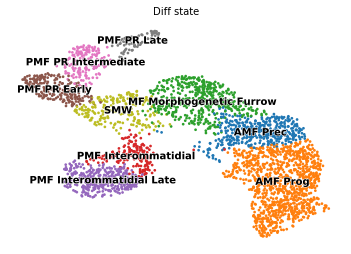

In [11]:
%matplotlib inline
scv.pl.umap(adata_rna, color='Diff_state')

In [12]:
adata_atac.obsp['connectivities'] = adata_force.obsp['connectivities']
adata_rna.obsp['connectivities'] = adata_force.obsp['connectivities']
adata_atac.obsp['distances'] = adata_force.obsp['distances']
adata_rna.obsp['distances'] = adata_force.obsp['distances']

In [13]:
conn = adata_force.obsp['connectivities']

In [14]:
conn_norm = conn.multiply(1.0 / conn.sum(1)).tocsr()

In [15]:
from scipy.sparse import coo_matrix, csr_matrix, diags
adata_atac.layers['Mc'] = csr_matrix.dot(conn_norm, adata_atac.X)

In [16]:
adata_rna.obsp['connectivities'] = adata_force.obsp['connectivities']

In [17]:
shared_genes = shared_genes.tolist()

In [18]:
len(shared_genes)

7739

In [21]:
# Remove FoxP, gives a weird len error (?)
shared_genes = shared_genes[0:1853] + shared_genes[1855:]

In [22]:
shared_genes = shared_genes[0:3857] + shared_genes[3859:]

In [23]:
shared_genes = shared_genes[0:2171] + shared_genes[2173:]

In [24]:
shared_genes = shared_genes[0:2333] + shared_genes[2335:]

In [31]:
shared_genes = shared_genes[0:3981] + shared_genes[3983:]

In [43]:
shared_genes = shared_genes[0:4714] + shared_genes[4716:]

In [27]:
import importlib
importlib.reload(mv)

<module 'multivelo' from '/lustre1/project/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/EAD_3/velocity/MultiVelo/src/multivelo/__init__.py'>

In [42]:
adata_result = mv.recover_dynamics_chrom(adata_rna,
                                         adata_atac,
                                         gene_list=shared_genes[4715],
                                         max_iter=5,
                                         init_mode="invert",
                                         verbose=True,
                                         parallel=True,
                                         save_plot=False,
                                         rna_only=False,
                                         fit=True,
                                         n_anchors=500,
                                         extra_color_key='Diff_state'
                                        )

1 genes will be fitted


  0%|          | 0/1 [00:00<?, ?it/s]

@@@@@fitting Orct
predicted partial trajectory: True
predicted trajectory direction: on
predicted model: 1
None


UnboundLocalError: local variable 't3' referenced before assignment

In [44]:
adata_result = mv.recover_dynamics_chrom(adata_rna,
                                         adata_atac,
                                         gene_list=shared_genes,
                                         max_iter=5,
                                         init_mode="invert",
                                         verbose=True,
                                         parallel=True,
                                         save_plot=False,
                                         rna_only=False,
                                         fit=True,
                                         n_anchors=500,
                                         extra_color_key='Diff_state'
                                        )

7727 genes will be fitted
running 36 jobs in parallel


  0%|          | 0/7727 [00:00<?, ?it/s]

In [ ]:
adata_rna.write("/staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/EAD_3/velocity/multivelo_adata_rna_final.h5ad")
adata_atac.write("/staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/EAD_3/velocity/multivelo_adata_atac_final.h5ad")

In [46]:
adata_result.write("/staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/EAD_3/velocity/multivelo_result_all_genes.h5ad")

In [32]:
adata_result = sc.read("/staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/EAD_3/velocity/multivelo_result_all_genes.h5ad")

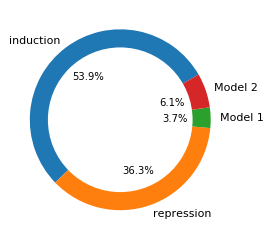

In [33]:
%matplotlib inline
mv.pie_summary(adata_result)

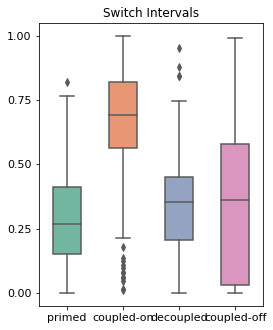

In [34]:
mv.switch_time_summary(adata_result)

In [35]:
mv.velocity_graph(adata_result)
mv.latent_time(adata_result)

ValueError: Velocity matrix is not found. Please run multivelo.recover_dynamics_chrom function first.

computing velocity embedding
    finished (0:00:00) --> added
    'velo_s_norm_umap', embedded velocity vectors (adata.obsm)


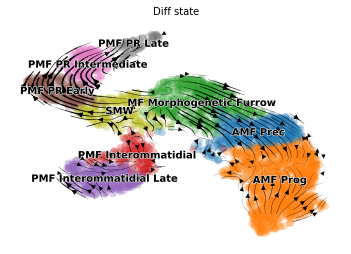

In [8]:
mv.velocity_embedding_stream(adata_result, basis='umap', color='Diff_state')

In [18]:
adata_result.layers

Layers with keys: ATAC, Ms, Mu, fit_state, fit_t, spliced, unspliced, velo_chrom, velo_s, velo_u, velo_s_norm, velocity, variance_velocity

In [36]:
scv.tl.velocity(adata_result, mode='stochastic')

computing velocities
    finished (0:00:06) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)


In [39]:
scv.tl.velocity_graph(adata_result)

computing velocity graph (using 1/36 cores)


  0%|          | 0/3104 [00:00<?, ?cells/s]

    finished (0:00:16) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


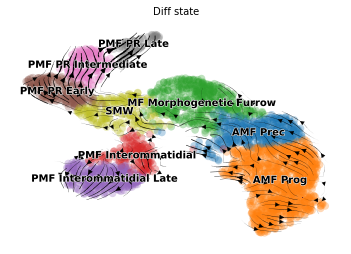

In [40]:
%matplotlib inline
scv.pl.velocity_embedding_stream(adata_result, basis='umap', color='Diff_state', vkey="velocity")

saving figure to file /staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/EAD_3/velocity/multivelo_strean.png


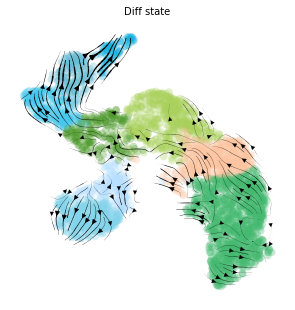

In [44]:
%matplotlib inline
colors={
    "AMF_Prog": "#FCC39E",
    "AMF_Prec": "#42B86E",
    "MF_Morphogenetic_Furrow": "#A8D05A",
    "PMF_Interommatidial": "#B5DEFF",
    "PMF_Interommatidial_Late": "#82D3EA",
    "PMF_PR_Early": "#42C6EC",
    "PMF_PR_Intermediate": "#63BBD1",
    "PMF_PR_Late": "#12b0de",
    "SMW": "#4C9A2A"
}
from matplotlib.pyplot import rc_context
with rc_context({'figure.figsize': (5,5)}):
    scv.pl.velocity_embedding_stream(adata_result, basis='umap', color='Diff_state', palette=[colors[x] for x in colors.keys()], legend_loc='none', save='/staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/EAD_3/velocity/multivelo_strean.png')

In [42]:
scv.latent_time(adata_result)

AttributeError: module 'scvelo' has no attribute 'latent_time'

ValueError: color key is invalid! pass valid observation annotation or a gene name

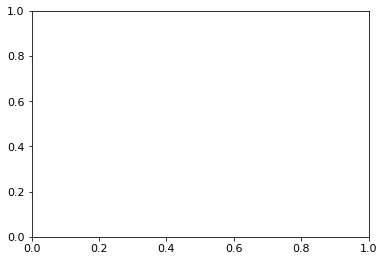

In [41]:
scv.pl.scatter(adata_result, color='latent_time', color_map='gnuplot', size=80)

# 3. MultiVelo (all region-gene)

In [1]:
import os
os.chdir('/staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/EAD_3/velocity/MultiVelo/')
import scipy
import numpy as np
import pandas as pd
import scanpy as sc
import scvelo as scv
import multivelo as mv
import matplotlib.pyplot as plt

/user/leuven/313/vsc31305/.local/lib/python3.7/site-packages/dask/config.py:161: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  data = yaml.load(f.read()) or {}


In [2]:
scv.settings.verbosity = 3
scv.settings.presenter_view = True
scv.set_figure_params('scvelo')
pd.set_option('display.max_columns', 100)
pd.set_option('display.max_rows', 200)
np.set_printoptions(suppress=True)

In [30]:
# To read
import scanpy as sc
adata_rna = sc.read_h5ad('/staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/EAD_3/velocity/rna_anndata.h5ad')
adata_atac = sc.read_h5ad('/staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/EAD_3/velocity/atac_anndata.h5ad')

In [48]:
adata_atac 

AnnData object with n_obs × n_vars = 5296 × 125182

In [31]:
# Add UMAP from the other object
import scanpy as sc
adata_force = sc.read_h5ad('/staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/EAD_3/atac/scenicplus_v2/differenrentiation_tutorial_4.h5ad')

In [32]:
adata_rna = adata_rna[adata_force.obs.index.tolist()]
adata_rna.obsm['X_umap'] = adata_force.obsm['X_umap']
adata_rna.obs = adata_force.obs

adata_atac = adata_atac[adata_force.obs.index.tolist()]
adata_atac.obsm['X_umap'] = adata_force.obsm['X_umap']
adata_atac.obs = adata_force.obs

In [33]:
scv.pp.filter_and_normalize(adata_rna, min_shared_counts=10, n_top_genes=1000)

Filtered out 817 genes that are detected 10 counts (shared).
Normalized count data: X, spliced, unspliced.
Extracted 1000 highly variable genes.
Logarithmized X.


In [52]:
adata_atac.var.to_csv('/staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/EAD_3/velocity/region_names.tsv', header=False)

In [70]:
adata_atac.var_names

Index(['2R:14128580-14129080', '3R:30025964-30026464', '2R:19994888-19995388',
       '2R:3171581-3173487', '3L:18438407-18439504', 'X:5607615-5608129',
       '3L:1411472-1411524', '2R:15945434-15945503', '3R:9647140-9648122',
       '2L:2576508-2577008',
       ...
       'Y:3568574-3568853', 'Y:3569495-3569550', 'Y:372542-374631',
       'Y:463458-466252', 'Y:477459-477513', 'Y:490487-490552',
       'Y:662012-662067', 'Y:74311-76458', 'Y:782964-787144', 'Y:81910-82648'],
      dtype='object', length=125182)

In [34]:
def aggregate_peaks_10x_x(adata_atac, peak_annot_file, linkage_file, peak_dist=10000, min_corr=0.5, gene_body=False, return_dict=False, verbose=False):
    """Peak to gene aggregation.
    This function aggregates promoter and enhancer peaks to genes based on the 10X linkage file.
    Parameters
    ----------
    adata_atac: :class:`~anndata.AnnData`
        ATAC anndata object which stores raw peak counts.
    peak_annot_file: `str`
        Peak annotation file from 10X CellRanger ARC.
    linkage_file: `str`
        Peak-gene linkage file from 10X CellRanger ARC. This file stores highly correlated peak-peak
        and peak-gene pair information.
    peak_dist: `int` (default: 10000)
        Maximum distance for peaks to be included for a gene.
    min_corr: `float` (default: 0.5)
        Minimum correlation for a peak to be considered as enhancer.
    gene_body: `bool` (default: `False`)
        Whether to add gene body peaks to the associated promoters.
    return_dict: `bool` (default: `False`)
        Whether to return promoter and enhancer dictionaries.
    verbose: `bool` (default: `False`)
        Whether to print number of genes with promoter peaks.
    Returns
    -------
    A new ATAC anndata object which stores gene aggreagted peak counts.
    Additionally, if `return_dict==True`:
        A dictionary which stores genes and promoter peaks.
        And a dictionary which stores genes and enhancer peaks.
    """
    promoter_dict = {}
    distal_dict = {}
    gene_body_dict = {}
    corr_dict = {}

    # read annotations
    with open(peak_annot_file) as f:
        header = next(f)
        tmp = header.split('\t')
        if len(tmp) == 4:
            cellranger_version = 1
        elif len(tmp) == 6:
            cellranger_version = 2
        else:
            raise ValueError('Peak annotation file should contain 4 columns (CellRanger ARC 1.0.0) or 5 columns (CellRanger ARC 2.0.0)')
        if verbose:
            print(f'CellRanger ARC identified as {cellranger_version}.0.0')
        if cellranger_version == 1:
            for line in f:
                tmp = line.rstrip().split('\t')
                tmp1 = tmp[0].split('_')
                peak = f'{tmp1[0]}:{tmp1[1]}-{tmp1[2]}'
                if tmp[1] != '':
                    genes = tmp[1].split(';')
                    dists = tmp[2].split(';')
                    types = tmp[3].split(';')
                    for i,gene in enumerate(genes):
                        dist = dists[i]
                        annot = types[i]
                        if annot == 'promoter':
                            if gene not in promoter_dict:
                                promoter_dict[gene] = [peak]
                            else:
                                promoter_dict[gene].append(peak)
                        elif annot == 'distal':
                            if dist == '0':
                                if gene not in gene_body_dict:
                                    gene_body_dict[gene] = [peak]
                                else:
                                    gene_body_dict[gene].append(peak)
                            else:
                                if gene not in distal_dict:
                                    distal_dict[gene] = [peak]
                                else:
                                    distal_dict[gene].append(peak)
        else:
            for line in f:
                tmp = line.rstrip().split('\t')
                peak = f'{tmp[0]}:{tmp[1]}-{tmp[2]}'
                gene = tmp[3]
                dist = tmp[4]
                annot = tmp[5]
                if annot == 'promoter':
                    if gene not in promoter_dict:
                        promoter_dict[gene] = [peak]
                    else:
                        promoter_dict[gene].append(peak)
                elif annot == 'distal':
                    if dist == '0':
                        if gene not in gene_body_dict:
                            gene_body_dict[gene] = [peak]
                        else:
                            gene_body_dict[gene].append(peak)
                    else:
                        if gene not in distal_dict:
                            distal_dict[gene] = [peak]
                        else:
                            distal_dict[gene].append(peak)

    # read linkages
    with open(linkage_file) as f:
        for line in f:
            tmp = line.rstrip().split('\t')
            if tmp[12] == "peak-gene":
                peak1 = f'{tmp[0]}:{tmp[1]}-{tmp[2]}'
                tmp2 = tmp[6].split('><')[0][1:].split(';')
                gene2 = tmp[6].split('><')[1][:-1]
                #print(tmp)
                corr = float(tmp[7])
                for t2 in tmp2:
                    gene1 = t2.split('_')
                    # peak 1 belongs to gene 2 or are close in distance -> peak 1 is added to gene 2
                    if ((gene1[0] == gene2) or (float(tmp[11]) < peak_dist)):
                        gene = gene1[0]
                        if gene in corr_dict:
                                corr_dict[gene][0].append(peak1)
                                corr_dict[gene][1].append(corr)
                        else:
                                corr_dict[gene] = [[peak1], [corr]]

    gene_dict = promoter_dict
    enhancer_dict = {}
    promoter_genes = list(promoter_dict.keys())
    if verbose:
        print(f'Found {len(promoter_genes)} genes with promoter peaks')
    for gene in promoter_genes:
        if gene_body: # add gene-body peaks
            if gene in gene_body_dict:
                for peak in gene_body_dict[gene]:
                    if peak not in gene_dict[gene]:
                        gene_dict[gene].append(peak)
        enhancer_dict[gene] = []
        if gene in corr_dict: # add enhancer peaks
            for j, peak in enumerate(corr_dict[gene][0]):
                corr = corr_dict[gene][1][j]
                if corr > min_corr:
                    if peak not in gene_dict[gene]:
                        gene_dict[gene].append(peak)
                        enhancer_dict[gene].append(peak)

    # aggregate to genes
    adata_atac_X_copy = adata_atac.X
    gene_mat = np.zeros((adata_atac.shape[0], len(promoter_genes)))
    var_names = adata_atac.var_names.to_numpy()
    for i, gene in tqdm(enumerate(promoter_genes), total=len(promoter_genes)):
        peaks = gene_dict[gene]
        for peak in peaks:
            if peak in var_names:
                peak_index = np.where(var_names == peak)[0][0]
                gene_mat[:,i] += adata_atac_X_copy[:,peak_index]
    gene_mat[gene_mat < 0] = 0
    gene_mat = AnnData(X=csr_matrix(gene_mat))
    gene_mat.obs_names = pd.Index(list(adata_atac.obs_names))
    gene_mat.var_names = pd.Index(promoter_genes)
    gene_mat = gene_mat[:,gene_mat.X.sum(0) > 0]
    if return_dict:
        return gene_mat, promoter_dict, enhancer_dict
    else:
        return gene_mat

In [35]:
# Examples: 
# /staging/leuven/stg_00002/lcb/lcb_projects/TEW/Multiome/cellranger_arc/mouse_brain/TEW__014e25__c14e1d__Multiome_RNA_brain_10x_no_perm/outs/atac_peak_annotation.tsv
# /staging/leuven/stg_00002/lcb/lcb_projects/TEW/Multiome/cellranger_arc/mouse_brain/TEW__014e25__c14e1d__Multiome_RNA_brain_10x_no_perm/outs/analysis/feature_linkage/feature_linkage.bedpe
from tqdm import tqdm
from anndata import AnnData
from scipy.sparse import coo_matrix, csr_matrix, diags
adata_atac = aggregate_peaks_10x_x(adata_atac, 
                                    '/staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/EAD_3/velocity/atac_peak_annotation.tsv', 
                                    '/staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/EAD_3/velocity/feature_linkage_all.bedpe', 
                                    peak_dist=50000, min_corr=0, gene_body=True,
                                    verbose=True)

CellRanger ARC identified as 2.0.0
Found 13128 genes with promoter peaks


100%|██████████| 13128/13128 [14:43<00:00, 14.85it/s]  


In [36]:
adata_atac.write_h5ad('/staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/EAD_3/velocity/atac_anndata_multivelo_all_links_all.h5ad')

In [37]:
mv.tfidf_norm(adata_atac)

In [38]:
shared_cells = pd.Index(np.intersect1d(adata_rna.obs_names, adata_atac.obs_names))
shared_genes = pd.Index(np.intersect1d(adata_rna.var_names, adata_atac.var_names))
len(shared_cells), len(shared_genes)

(3104, 902)

In [39]:
adata_rna = adata_rna[shared_cells, shared_genes]
adata_atac = adata_atac[shared_cells, shared_genes]

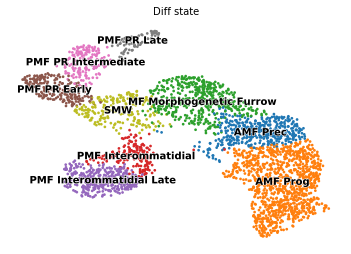

In [40]:
%matplotlib inline
scv.pl.umap(adata_rna, color='Diff_state')

In [41]:
adata_atac.obsp['connectivities'] = adata_force.obsp['connectivities']
adata_rna.obsp['connectivities'] = adata_force.obsp['connectivities']
adata_atac.obsp['distances'] = adata_force.obsp['distances']
adata_rna.obsp['distances'] = adata_force.obsp['distances']

In [42]:
conn = adata_force.obsp['connectivities']

In [43]:
conn_norm = conn.multiply(1.0 / conn.sum(1)).tocsr()

In [44]:
adata_atac.layers['Mc'] = csr_matrix.dot(conn_norm, adata_atac.X)

In [45]:
scv.pp.normalize_per_cell(adata_rna)
scv.pp.log1p(adata_rna)
scv.pp.moments(adata_rna, n_pcs=30, n_neighbors=50)

computing neighbors
    finished (0:00:01) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [46]:
adata_rna.obsp['connectivities'] = adata_force.obsp['connectivities']

In [47]:
shared_genes = shared_genes.tolist()

In [48]:
# Remove FoxP, gives a weird len error (?)
shared_genes = shared_genes[0:407] + shared_genes[409:]

In [49]:
'FoxP' in shared_genes

False

In [50]:
adata_result = mv.recover_dynamics_chrom(adata_rna,
                                         adata_atac,
                                         gene_list=shared_genes,
                                         max_iter=5,
                                         init_mode="invert",
                                         verbose=True,
                                         parallel=True,
                                         save_plot=False,
                                         rna_only=False,
                                         fit=True,
                                         n_anchors=500,
                                         extra_color_key='Diff_state'
                                        )

900 genes will be fitted
running 36 jobs in parallel


  0%|          | 0/900 [00:00<?, ?it/s]

In [ ]:
adata_rna.write("/staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/EAD_3/velocity/multivelo_adata_rna_final.h5ad")
adata_atac.write("/staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/EAD_3/velocity/multivelo_adata_atac_final.h5ad")

In [51]:
adata_result.write("/staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/EAD_3/velocity/multivelo_result_all_links_all.h5ad")

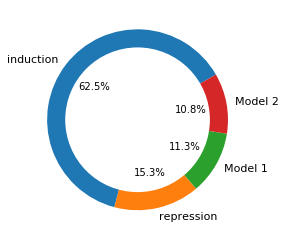

In [52]:
%matplotlib inline
mv.pie_summary(adata_result)

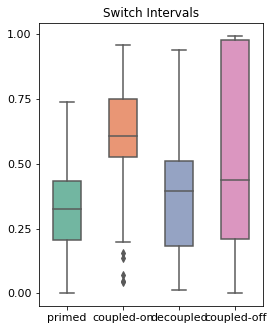

In [53]:
mv.switch_time_summary(adata_result)

In [54]:
mv.velocity_graph(adata_result)
mv.latent_time(adata_result)

computing velocity graph (using 1/36 cores)


  0%|          | 0/3104 [00:00<?, ?cells/s]

    finished (0:00:04) --> added 
    'velo_s_norm_graph', sparse matrix with cosine correlations (adata.uns)
computing terminal states
    identified 4 regions of root cells and 1 region of end points .
    finished (0:00:00) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)
computing latent time using root_cells as prior
    finished (0:00:02) --> added 
    'latent_time', shared time (adata.obs)


computing velocity embedding
    finished (0:00:00) --> added
    'velo_s_norm_umap', embedded velocity vectors (adata.obsm)


/data/leuven/software/biomed/skylake_centos7/2018a/software/BiomedBundle/20190901-foss-2018a-Python-3.7.4/lib/python3.7/site-packages/sklearn/neighbors/base.py:441: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  old_joblib = LooseVersion(joblib_version) < LooseVersion('0.12')


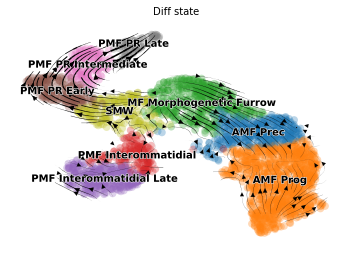

In [55]:
mv.velocity_embedding_stream(adata_result, basis='umap', color='Diff_state')

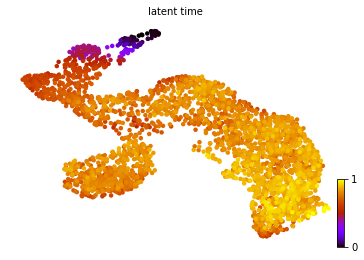

In [164]:
scv.pl.scatter(adata_result, color='latent_time', color_map='gnuplot', size=80)

# 4. MultiVelo with imputed data

In [65]:
import os
os.chdir('/staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/EAD_3/velocity/MultiVelo/')
import scipy
import numpy as np
import pandas as pd
import scanpy as sc
import scvelo as scv
import multivelo as mv
import matplotlib.pyplot as plt

In [66]:
scv.settings.verbosity = 3
scv.settings.presenter_view = True
scv.set_figure_params('scvelo')
pd.set_option('display.max_columns', 100)
pd.set_option('display.max_rows', 200)
np.set_printoptions(suppress=True)

In [67]:
# To read
import scanpy as sc
adata_rna = sc.read_h5ad('/staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/EAD_3/velocity/rna_anndata.h5ad')
adata_atac = sc.read_h5ad('/staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/EAD_3/velocity/atac_anndata_imputed.h5ad')

In [68]:
adata_atac 

AnnData object with n_obs × n_vars = 5296 × 124894

In [69]:
# Add UMAP from the other object
import scanpy as sc
adata_force = sc.read_h5ad('/staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/EAD_3/atac/scenicplus_v2/differenrentiation_tutorial_4.h5ad')

In [70]:
adata_rna = adata_rna[adata_force.obs.index.tolist()]
adata_rna.obsm['X_umap'] = adata_force.obsm['X_umap']
adata_rna.obs = adata_force.obs

adata_atac = adata_atac[adata_force.obs.index.tolist()]
adata_atac.obsm['X_umap'] = adata_force.obsm['X_umap']
adata_atac.obs = adata_force.obs

In [71]:
scv.pp.filter_and_normalize(adata_rna, min_shared_counts=10, n_top_genes=1000)

Filtered out 817 genes that are detected 10 counts (shared).
Normalized count data: X, spliced, unspliced.
Extracted 1000 highly variable genes.
Logarithmized X.


In [72]:
adata_atac.var.to_csv('/staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/EAD_3/velocity/region_names.tsv', header=False)

In [70]:
adata_atac.var_names

Index(['2R:14128580-14129080', '3R:30025964-30026464', '2R:19994888-19995388',
       '2R:3171581-3173487', '3L:18438407-18439504', 'X:5607615-5608129',
       '3L:1411472-1411524', '2R:15945434-15945503', '3R:9647140-9648122',
       '2L:2576508-2577008',
       ...
       'Y:3568574-3568853', 'Y:3569495-3569550', 'Y:372542-374631',
       'Y:463458-466252', 'Y:477459-477513', 'Y:490487-490552',
       'Y:662012-662067', 'Y:74311-76458', 'Y:782964-787144', 'Y:81910-82648'],
      dtype='object', length=125182)

In [73]:
def aggregate_peaks_10x_x(adata_atac, peak_annot_file, linkage_file, peak_dist=10000, min_corr=0.5, gene_body=False, return_dict=False, verbose=False):
    """Peak to gene aggregation.
    This function aggregates promoter and enhancer peaks to genes based on the 10X linkage file.
    Parameters
    ----------
    adata_atac: :class:`~anndata.AnnData`
        ATAC anndata object which stores raw peak counts.
    peak_annot_file: `str`
        Peak annotation file from 10X CellRanger ARC.
    linkage_file: `str`
        Peak-gene linkage file from 10X CellRanger ARC. This file stores highly correlated peak-peak
        and peak-gene pair information.
    peak_dist: `int` (default: 10000)
        Maximum distance for peaks to be included for a gene.
    min_corr: `float` (default: 0.5)
        Minimum correlation for a peak to be considered as enhancer.
    gene_body: `bool` (default: `False`)
        Whether to add gene body peaks to the associated promoters.
    return_dict: `bool` (default: `False`)
        Whether to return promoter and enhancer dictionaries.
    verbose: `bool` (default: `False`)
        Whether to print number of genes with promoter peaks.
    Returns
    -------
    A new ATAC anndata object which stores gene aggreagted peak counts.
    Additionally, if `return_dict==True`:
        A dictionary which stores genes and promoter peaks.
        And a dictionary which stores genes and enhancer peaks.
    """
    promoter_dict = {}
    distal_dict = {}
    gene_body_dict = {}
    corr_dict = {}

    # read annotations
    with open(peak_annot_file) as f:
        header = next(f)
        tmp = header.split('\t')
        if len(tmp) == 4:
            cellranger_version = 1
        elif len(tmp) == 6:
            cellranger_version = 2
        else:
            raise ValueError('Peak annotation file should contain 4 columns (CellRanger ARC 1.0.0) or 5 columns (CellRanger ARC 2.0.0)')
        if verbose:
            print(f'CellRanger ARC identified as {cellranger_version}.0.0')
        if cellranger_version == 1:
            for line in f:
                tmp = line.rstrip().split('\t')
                tmp1 = tmp[0].split('_')
                peak = f'{tmp1[0]}:{tmp1[1]}-{tmp1[2]}'
                if tmp[1] != '':
                    genes = tmp[1].split(';')
                    dists = tmp[2].split(';')
                    types = tmp[3].split(';')
                    for i,gene in enumerate(genes):
                        dist = dists[i]
                        annot = types[i]
                        if annot == 'promoter':
                            if gene not in promoter_dict:
                                promoter_dict[gene] = [peak]
                            else:
                                promoter_dict[gene].append(peak)
                        elif annot == 'distal':
                            if dist == '0':
                                if gene not in gene_body_dict:
                                    gene_body_dict[gene] = [peak]
                                else:
                                    gene_body_dict[gene].append(peak)
                            else:
                                if gene not in distal_dict:
                                    distal_dict[gene] = [peak]
                                else:
                                    distal_dict[gene].append(peak)
        else:
            for line in f:
                tmp = line.rstrip().split('\t')
                peak = f'{tmp[0]}:{tmp[1]}-{tmp[2]}'
                gene = tmp[3]
                dist = tmp[4]
                annot = tmp[5]
                if annot == 'promoter':
                    if gene not in promoter_dict:
                        promoter_dict[gene] = [peak]
                    else:
                        promoter_dict[gene].append(peak)
                elif annot == 'distal':
                    if dist == '0':
                        if gene not in gene_body_dict:
                            gene_body_dict[gene] = [peak]
                        else:
                            gene_body_dict[gene].append(peak)
                    else:
                        if gene not in distal_dict:
                            distal_dict[gene] = [peak]
                        else:
                            distal_dict[gene].append(peak)

    # read linkages
    with open(linkage_file) as f:
        for line in f:
            tmp = line.rstrip().split('\t')
            if tmp[12] == "peak-gene":
                peak1 = f'{tmp[0]}:{tmp[1]}-{tmp[2]}'
                tmp2 = tmp[6].split('><')[0][1:].split(';')
                gene2 = tmp[6].split('><')[1][:-1]
                #print(tmp)
                corr = float(tmp[7])
                for t2 in tmp2:
                    gene1 = t2.split('_')
                    # peak 1 belongs to gene 2 or are close in distance -> peak 1 is added to gene 2
                    if ((gene1[0] == gene2) or (float(tmp[11]) < peak_dist)):
                        gene = gene1[0]
                        if gene in corr_dict:
                                corr_dict[gene][0].append(peak1)
                                corr_dict[gene][1].append(corr)
                        else:
                                corr_dict[gene] = [[peak1], [corr]]

    gene_dict = promoter_dict
    enhancer_dict = {}
    promoter_genes = list(promoter_dict.keys())
    if verbose:
        print(f'Found {len(promoter_genes)} genes with promoter peaks')
    for gene in promoter_genes:
        if gene_body: # add gene-body peaks
            if gene in gene_body_dict:
                for peak in gene_body_dict[gene]:
                    if peak not in gene_dict[gene]:
                        gene_dict[gene].append(peak)
        enhancer_dict[gene] = []
        if gene in corr_dict: # add enhancer peaks
            for j, peak in enumerate(corr_dict[gene][0]):
                corr = corr_dict[gene][1][j]
                if corr > min_corr:
                    if peak not in gene_dict[gene]:
                        gene_dict[gene].append(peak)
                        enhancer_dict[gene].append(peak)

    # aggregate to genes
    adata_atac_X_copy = adata_atac.X
    gene_mat = np.zeros((adata_atac.shape[0], len(promoter_genes)))
    var_names = adata_atac.var_names.to_numpy()
    for i, gene in tqdm(enumerate(promoter_genes), total=len(promoter_genes)):
        peaks = gene_dict[gene]
        for peak in peaks:
            if peak in var_names:
                peak_index = np.where(var_names == peak)[0][0]
                gene_mat[:,i] += adata_atac_X_copy[:,peak_index]
    gene_mat[gene_mat < 0] = 0
    gene_mat = AnnData(X=csr_matrix(gene_mat))
    gene_mat.obs_names = pd.Index(list(adata_atac.obs_names))
    gene_mat.var_names = pd.Index(promoter_genes)
    gene_mat = gene_mat[:,gene_mat.X.sum(0) > 0]
    if return_dict:
        return gene_mat, promoter_dict, enhancer_dict
    else:
        return gene_mat

In [74]:
# Examples: 
# /staging/leuven/stg_00002/lcb/lcb_projects/TEW/Multiome/cellranger_arc/mouse_brain/TEW__014e25__c14e1d__Multiome_RNA_brain_10x_no_perm/outs/atac_peak_annotation.tsv
# /staging/leuven/stg_00002/lcb/lcb_projects/TEW/Multiome/cellranger_arc/mouse_brain/TEW__014e25__c14e1d__Multiome_RNA_brain_10x_no_perm/outs/analysis/feature_linkage/feature_linkage.bedpe
from tqdm import tqdm
from anndata import AnnData
from scipy.sparse import coo_matrix, csr_matrix, diags
adata_atac = aggregate_peaks_10x_x(adata_atac, 
                                    '/staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/EAD_3/velocity/atac_peak_annotation.tsv', 
                                    '/staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/EAD_3/velocity/feature_linkage.bedpe', 
                                    peak_dist=100000, min_corr=0, gene_body=True,
                                    verbose=True)

CellRanger ARC identified as 2.0.0
Found 13128 genes with promoter peaks


100%|██████████| 13128/13128 [09:06<00:00, 24.02it/s] 


In [75]:
adata_atac.write_h5ad('/staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/EAD_3/velocity/atac_anndata_multivelo_imputed.h5ad')

In [100]:
#mv.tfidf_norm(adata_atac)

In [76]:
shared_cells = pd.Index(np.intersect1d(adata_rna.obs_names, adata_atac.obs_names))
shared_genes = pd.Index(np.intersect1d(adata_rna.var_names, adata_atac.var_names))
len(shared_cells), len(shared_genes)

(3104, 903)

In [77]:
adata_rna = adata_rna[shared_cells, shared_genes]
adata_atac = adata_atac[shared_cells, shared_genes]

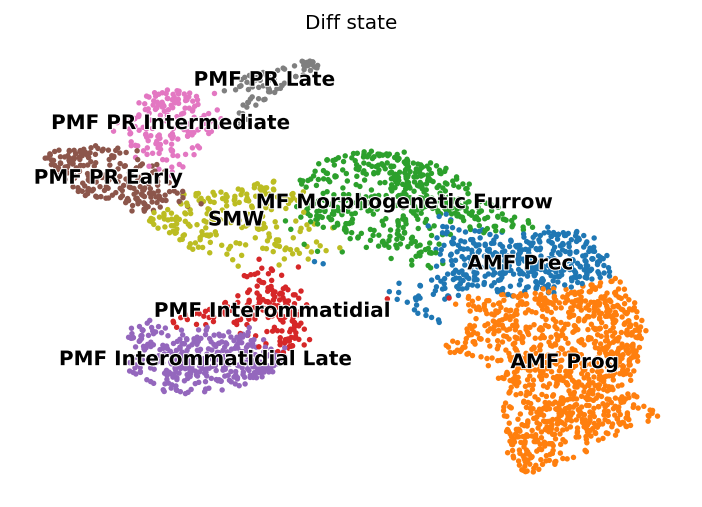

In [78]:
%matplotlib inline
scv.pl.umap(adata_rna, color='Diff_state')

In [79]:
adata_atac.obsp['connectivities'] = adata_force.obsp['connectivities']
adata_rna.obsp['connectivities'] = adata_force.obsp['connectivities']
adata_atac.obsp['distances'] = adata_force.obsp['distances']
adata_rna.obsp['distances'] = adata_force.obsp['distances']

In [80]:
conn = adata_force.obsp['connectivities']

In [81]:
conn_norm = conn.multiply(1.0 / conn.sum(1)).tocsr()

In [82]:
adata_atac.layers['Mc'] = csr_matrix.dot(conn_norm, adata_atac.X)

In [83]:
scv.pp.normalize_per_cell(adata_rna)
scv.pp.log1p(adata_rna)
scv.pp.moments(adata_rna, n_pcs=30, n_neighbors=50)

computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [84]:
adata_rna.obsp['connectivities'] = adata_force.obsp['connectivities']

In [85]:
shared_genes = shared_genes.tolist()

In [87]:
shared_genes.index('FoxP')

409

In [88]:
# Remove FoxP, gives a weird len error (?)
shared_genes = shared_genes[0:408] + shared_genes[410:]

In [89]:
'FoxP' in shared_genes

False

In [106]:
adata_result = mv.recover_dynamics_chrom(adata_rna,
                                         adata_atac,
                                         gene_list=shared_genes,
                                         max_iter=5,
                                         init_mode="invert",
                                         verbose=True,
                                         parallel=True,
                                         save_plot=False,
                                         rna_only=True,
                                         fit=True,
                                         n_anchors=500,
                                         extra_color_key='Diff_state'
                                        )

901 genes will be fitted
Skipping model checking for RNA-only, running model 2
running 36 jobs in parallel


  0%|          | 0/901 [00:00<?, ?it/s]

In [ ]:
adata_rna.write("/staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/EAD_3/velocity/multivelo_adata_rna_final.h5ad")
adata_atac.write("/staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/EAD_3/velocity/multivelo_adata_atac_final.h5ad")

In [91]:
adata_result.write("/staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/EAD_3/velocity/multivelo_result_imputed.h5ad")

In [20]:
adata_result = sc.read("/staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/EAD_3/velocity/multivelo_result_imputed.h5ad")

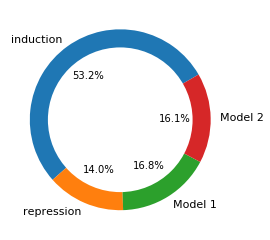

In [21]:
%matplotlib inline
mv.pie_summary(adata_result)

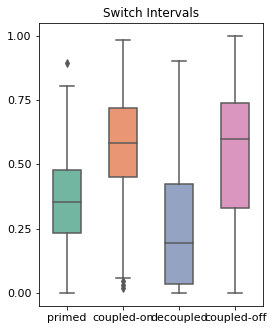

In [22]:
mv.switch_time_summary(adata_result)

In [23]:
adata_result.obs

,EXP_VM_RNA_x,EXP_VM_RNA_y,EXP_VM_RNA_R,EXP_VM_RNA_G,EXP_VM_RNA_B,EXP_VM_RNA_cluster,EXP_VM_RNA_cluster_color,EXP_VM_RNA_cluster_refined,EXP_VM_RNA_cluster_refined_color,EXP_VM_RNA_cluster_annot,EXP_VM_RNA_is.landmark,EXP_VM_RNA_RM_assignment,EXP_VM_RNA_RM_cell_type,EXP_VM_RNA_RM_landmark,EXP_VM_RNA_RM_pseudotime,EXP_VM_RNA_RM_posLandmark,EXP_VM_RNA_RM_spatial_cluster,EXP_VM_RNA_DistanceFromLandmark,EXP_VM_RNA_PseudotimeRank,EXP_VM_cell_name,EXP_Seurat_res_1.2,EXP_Experiment Run,EXP_Ariss labels,EXP_ATAC labels,EXP_RNA_cell_barcode,ACC_VM_ATAC_x,ACC_VM_ATAC_y,ACC_VM_ATAC_R,ACC_VM_ATAC_G,ACC_VM_ATAC_B,ACC_VM_ATAC_cluster,ACC_VM_ATAC_cluster_color,ACC_VM_ATAC_cluster_refined,ACC_VM_ATAC_cluster_refined_color,ACC_VM_ATAC_cluster_annot,ACC_VM_ATAC_is.landmark,ACC_VM_ATAC_RM_assignment,ACC_VM_ATAC_RM_cell_type,ACC_VM_ATAC_RM_landmark,ACC_VM_ATAC_RM_pseudotime,ACC_VM_ATAC_RM_posLandmark,ACC_VM_ATAC_RM_spatial_cluster,ACC_VM_ATAC_DistanceFromLandmark,ACC_VM_ATAC_PseudotimeRank,ACC_VM_cell_name,ACC_cisTopic_nr_frag,ACC_cisTopic_log_nr_frag,ACC_cisTopic_nr_acc,ACC_cisTopic_log_nr_acc,ACC_sample_id,ACC_Log_total_nr_frag,ACC_Log_unique_nr_frag,ACC_Total_nr_frag,ACC_Unique_nr_frag,ACC_Dupl_nr_frag,ACC_Dupl_rate,ACC_Total_nr_frag_in_regions,ACC_Unique_nr_frag_in_regions,ACC_FRIP,ACC_TSS_enrichment,ACC_barcode,ACC_cell_type,ACC_Doublet_scores_fragments,leiden,Diff_state,Diff_state_refined,dpt_pseudotime,distance,clusters,initial_size_unspliced,initial_size_spliced,initial_size,n_counts
44_27,44.0,27.0,0.956863,0.698039,0.705882,4.0,#FDA7F9,4.0,#FDA7F9,AMF_prog_prec,NaN,GACAGAGTCGCATGAT.2,AMF_prog_prec,Eye,3,Before,AMF_prog_prec,20.615528,393.0,44_27,AMF_prog_prec,2.0,PPN,AMF_prec,GACAGAGTCGCATGAT.2,44.0,27.0,0.956863,0.698039,0.705882,4.0,#FDA7F9,4.0,#FDA7F9,AMF_prog_prec,NaN,CACTGAATCAGGGTTT.2,AMF_Prec,Eye,179,Before,AMF_prog_prec,20.615528,2123.0,44_27,1517.0,3.180986,1359.0,3.133219,Run_2,3.495822,3.252368,3132.0,1788.0,1344.0,0.429119,2735.0,1545.0,0.864094,6.138131,CACTGAATCAGGGTTT-1,AMF_prog,0.163569,0,AMF_Prog,AMF_Prog,0.000000,0.000000,AMF_Prog,6022,6075,6075.0,213.344543
44_28,44.0,28.0,0.941176,0.525490,0.541176,4.0,#FDA7F9,4.0,#FDA7F9,AMF_prog_prec,NaN,GTCTCGTGTTTGCATG.1,AMF_prog_prec,Eye,14,Before,AMF_prog_prec,21.260292,382.0,44_28,AMF_prog_prec,1.0,PPN,AMF_prec,GTCTCGTGTTTGCATG.1,44.0,28.0,0.941176,0.525490,0.541176,4.0,#FDA7F9,4.0,#FDA7F9,AMF_prog_prec,NaN,GTTATGGGTTCCATCC.1,AMF_Prec,Eye,154,Before,AMF_prog_prec,21.260292,2148.0,44_28,611.0,2.786041,596.0,2.775246,Run_1,3.071145,2.831870,1178.0,679.0,499.0,0.423599,1028.0,589.0,0.867452,4.935573,GTTATGGGTTCCATCC-1,AMF_prog,0.078498,0,AMF_Prog,AMF_Prog,0.023337,0.023337,AMF_Prog,6855,4065,4065.0,397.346619
44_29,44.0,29.0,0.945098,0.513725,0.549020,4.0,#FDA7F9,4.0,#FDA7F9,AMF_prog_prec,NaN,TACTCGCAGGTAGCTG.2,AMF_prog_prec,Eye,6,Before,AMF_prog_prec,21.931712,390.0,44_29,AMF_prog_prec,2.0,PPN,AMF_prec,TACTCGCAGGTAGCTG.2,44.0,29.0,0.945098,0.513725,0.549020,4.0,#FDA7F9,4.0,#FDA7F9,AMF_prog_prec,NaN,CCTGCTAAGATTAGAC.2,AMF_Prec,Eye,222,Before,AMF_prog_prec,21.931712,2081.0,44_29,837.0,2.922725,790.0,2.897627,Run_2,3.224792,2.974972,1678.0,944.0,734.0,0.437426,1501.0,839.0,0.888771,6.071763,CCTGCTAAGATTAGAC-1,AMF_prog,0.123288,0,AMF_Prog,AMF_Prog,0.009482,0.009482,AMF_Prog,5731,5814,5814.0,169.768356
45_25,45.0,25.0,0.949020,0.521569,0.541176,4.0,#FDA7F9,4.0,#FDA7F9,AMF_prog_prec,NaN,CCGTGGAAGAAACCAT.3,AMF_prog_prec,Eye,70,Before,AMF_prog_prec,18.601075,326.0,45_25,AMF_prog_prec,3.0,other,Antenna_A1,CCGTGGAAGAAACCAT.3,45.0,25.0,0.949020,0.521569,0.541176,4.0,#FDA7F9,4.0,#FDA7F9,AMF_prog_prec,NaN,TTACTCATCATGAACC.1,AMF_Prec,Eye,414,Before,AMF_prog_prec,18.601075,1893.0,45_25,2238.0,3.349860,2019.0,3.305136,Run_1,3.865222,3.404834,7332.0,2540.0,4792.0,0.653573,6326.0,2179.0,0.857874,5.455753,TTACTCATCATGAACC-1,AMF_prog,0.134615,0,AMF_Prog,AMF_Prog,0.007090,0.007090,AMF_Prog,27237,27238,27238.0,332.894287
45_26,45.0,26.0,0.886275,0.105882,0.125490,4.0,#FDA7F9,4.0,#FDA7F9,AMF_prog_prec

In [24]:
mv.velocity_graph(adata_result, tkey='Diff_state_refined')
mv.latent_time(adata_result)

computing velocity graph (using 1/36 cores)


  0%|          | 0/3104 [00:00<?, ?cells/s]

    finished (0:00:06) --> added 
    'velo_s_norm_graph', sparse matrix with cosine correlations (adata.uns)
computing terminal states
    identified 0 region of root cells and 1 region of end points .
    finished (0:00:00) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)
computing latent time using root_cells as prior
    finished (0:00:00) --> added 
    'latent_time', shared time (adata.obs)


In [30]:
scv.tl.velocity(adata_result, mode='stochastic')

computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)


In [31]:
%matplotlib inline
scv.pl.velocity_embedding_stream(adata_result, basis='umap', color='Diff_state', vkey="velocity")

computing velocity embedding


ValueError: You need to run `tl.velocity_graph` first to compute cosine correlations.

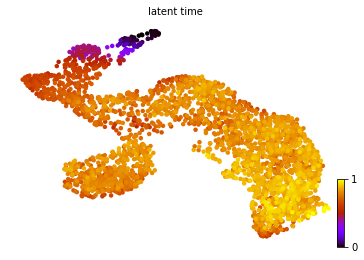

In [164]:
scv.pl.scatter(adata_result, color='latent_time', color_map='gnuplot', size=80)

In [100]:
scv.velocity_embedding_stream(adata_result, basis='umap', color='Diff_state')

AttributeError: module 'scvelo' has no attribute 'velocity_embedding_stream'